Delhivery is the largest and fastest-growing fully integrated player in India by revenue in Fiscal 2021. They aim to build the operating system for commerce, through a combination of world-class infrastructure, logistics operations of the highest quality, and cutting-edge engineering and technology capabilities.

The Data team builds intelligence and capabilities using this data that helps them to widen the gap between the quality, efficiency, and profitability of their business versus their competitors.

>data - tells whether the data is testing or training data
>trip_creation_time – Timestamp of trip creation
>route_schedule_uuid – Unique Id for a particular route schedule
>route_type – Transportation type
>FTL – Full Truck Load: FTL shipments get to the destination sooner, as the truck is making no other pickups or drop-offs along the way
>Carting: Handling system consisting of small vehicles (carts)
>trip_uuid - Unique ID given to a particular trip (A trip may include different source and destination centers)
>source_center - Source ID of trip origin
>source_name - Source Name of trip origin
>destination_cente – Destination ID
>destination_name – Destination Name
>od_start_time – Trip start time
>od_end_time – Trip end time
>start_scan_to_end_scan – Time taken to deliver from source to destination
>is_cutoff – Unknown field
>cutoff_factor – Unknown field
>cutoff_timestamp – Unknown field
>actual_distance_to_destination – Distance in Kms between source and destination warehouse
>actual_time – Actual time taken to complete the delivery (Cumulative)
>osrm_time – An open-source routing engine time calculator which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) and gives the time (Cumulative)
>osrm_distance – An open-source routing engine which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) (Cumulative)
>factor – Unknown field
>segment_actual_time – This is a segment time. Time taken by the subset of the package delivery
>segment_osrm_time – This is the OSRM segment time. Time taken by the subset of the package delivery
>segment_osrm_distance – This is the OSRM distance. Distance covered by subset of the package delivery
>segment_factor – Unknown field



PRoblem Statement

The company wants to understand and process the data coming out of data engineering pipelines:

• Clean, sanitize and manipulate data to get useful features out of raw fields

• Make sense out of the raw data and help the data science team to build forecasting models on it



Concept Used:

>Feature Creation

>Relationship between Features

>Column Normalization /Column Standardization

>Handling categorical values

>Missing values - Outlier treatment / Types of outliers

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!gdown https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/551/original/delhivery_data.csv?1642751181

Downloading...
From: https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/551/original/delhivery_data.csv?1642751181
To: /content/delhivery_data.csv?1642751181
100% 55.6M/55.6M [00:00<00:00, 121MB/s]


In [3]:
df = pd.read_csv('https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/551/original/delhivery_data.csv?1642751181')
df.head(2)

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111


In [4]:
df['start_scan_to_end_scan']

0          86.0
1          86.0
2          86.0
3          86.0
4          86.0
          ...  
144862    427.0
144863    427.0
144864    427.0
144865    427.0
144866    427.0
Name: start_scan_to_end_scan, Length: 144867, dtype: float64

In [5]:
df.shape

(144867, 24)

In [6]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            144867 non-null  object 
 1   trip_creation_time              144867 non-null  object 
 2   route_schedule_uuid             144867 non-null  object 
 3   route_type                      144867 non-null  object 
 4   trip_uuid                       144867 non-null  object 
 5   source_center                   144867 non-null  object 
 6   source_name                     144574 non-null  object 
 7   destination_center              144867 non-null  object 
 8   destination_name                144606 non-null  object 
 9   od_start_time                   144867 non-null  object 
 10  od_end_time                     144867 non-null  object 
 11  start_scan_to_end_scan          144867 non-null  float64
 12  is_cutoff       

In [8]:
for col in df.columns:
  print(col,": ", df[col].nunique())

data :  2
trip_creation_time :  14817
route_schedule_uuid :  1504
route_type :  2
trip_uuid :  14817
source_center :  1508
source_name :  1498
destination_center :  1481
destination_name :  1468
od_start_time :  26369
od_end_time :  26369
start_scan_to_end_scan :  1915
is_cutoff :  2
cutoff_factor :  501
cutoff_timestamp :  93180
actual_distance_to_destination :  144515
actual_time :  3182
osrm_time :  1531
osrm_distance :  138046
factor :  45641
segment_actual_time :  747
segment_osrm_time :  214
segment_osrm_distance :  113799
segment_factor :  5675


In [9]:
for i in df:
  print(i , ': ', df[i].describe(include = 'all'))
  print('***********')

data :  count       144867
unique           2
top       training
freq        104858
Name: data, dtype: object
***********
trip_creation_time :  count                         144867
unique                         14817
top       2018-09-28 05:23:15.359220
freq                             101
Name: trip_creation_time, dtype: object
***********
route_schedule_uuid :  count                                                144867
unique                                                 1504
top       thanos::sroute:4029a8a2-6c74-4b7e-a6d8-f9e069f...
freq                                                   1812
Name: route_schedule_uuid, dtype: object
***********
route_type :  count     144867
unique         2
top          FTL
freq       99660
Name: route_type, dtype: object
***********
trip_uuid :  count                      144867
unique                      14817
top       trip-153811219535896559
freq                          101
Name: trip_uuid, dtype: object
***********
source_center :  count

In [10]:
df.isnull().sum()

data                                0
trip_creation_time                  0
route_schedule_uuid                 0
route_type                          0
trip_uuid                           0
source_center                       0
source_name                       293
destination_center                  0
destination_name                  261
od_start_time                       0
od_end_time                         0
start_scan_to_end_scan              0
is_cutoff                           0
cutoff_factor                       0
cutoff_timestamp                    0
actual_distance_to_destination      0
actual_time                         0
osrm_time                           0
osrm_distance                       0
factor                              0
segment_actual_time                 0
segment_osrm_time                   0
segment_osrm_distance               0
segment_factor                      0
dtype: int64

In [11]:
print('destination_name:', df['source_name'].nunique())
print('destination_name: ', df['destination_name'].nunique())

destination_name: 1498
destination_name:  1468


In [12]:
print("Data type of 'source_name':", df['source_name'].dtypes)
print("Data type of 'destination_name':", df['destination_name'].dtypes)

Data type of 'source_name': object
Data type of 'destination_name': object


In [13]:
print("mode of 'source_name':", df['source_name'].mode())
print("mode of 'destination_name':", df['destination_name'].mode)

mode of 'source_name': 0    Gurgaon_Bilaspur_HB (Haryana)
Name: source_name, dtype: object
mode of 'destination_name': <bound method Series.mode of 0         Khambhat_MotvdDPP_D (Gujarat)
1         Khambhat_MotvdDPP_D (Gujarat)
2         Khambhat_MotvdDPP_D (Gujarat)
3         Khambhat_MotvdDPP_D (Gujarat)
4         Khambhat_MotvdDPP_D (Gujarat)
                      ...              
144862    Gurgaon_Bilaspur_HB (Haryana)
144863    Gurgaon_Bilaspur_HB (Haryana)
144864    Gurgaon_Bilaspur_HB (Haryana)
144865    Gurgaon_Bilaspur_HB (Haryana)
144866    Gurgaon_Bilaspur_HB (Haryana)
Name: destination_name, Length: 144867, dtype: object>


In [14]:
df['source_name'].fillna('Gurgaon_Bilaspur_HB (Haryana)', inplace=True)
print("Remaining missing values in 'source_name':", df['source_name'].isnull().sum())

df['destination_name'].fillna('Khambhat_MotvdDPP_D (Gujarat)', inplace=True)
print("Remaining missing values in 'destination_name':", df['destination_name'].isnull().sum())

Remaining missing values in 'source_name': 0
Remaining missing values in 'destination_name': 0


In [15]:
df.isnull().sum()

data                              0
trip_creation_time                0
route_schedule_uuid               0
route_type                        0
trip_uuid                         0
source_center                     0
source_name                       0
destination_center                0
destination_name                  0
od_start_time                     0
od_end_time                       0
start_scan_to_end_scan            0
is_cutoff                         0
cutoff_factor                     0
cutoff_timestamp                  0
actual_distance_to_destination    0
actual_time                       0
osrm_time                         0
osrm_distance                     0
factor                            0
segment_actual_time               0
segment_osrm_time                 0
segment_osrm_distance             0
segment_factor                    0
dtype: int64

In [16]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
numeric_columns

Index(['start_scan_to_end_scan', 'cutoff_factor',
       'actual_distance_to_destination', 'actual_time', 'osrm_time',
       'osrm_distance', 'factor', 'segment_actual_time', 'segment_osrm_time',
       'segment_osrm_distance', 'segment_factor'],
      dtype='object')

In [17]:
Training  = df[df['data'] == 'training']
Test  = df[df['data'] == 'test']
Training.shape, Test.shape

((104858, 24), (40009, 24))

In [18]:
cat_cols = df.columns[(df.dtypes == "object") | (df.dtypes == "bool")]
cat_cols

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time', 'is_cutoff',
       'cutoff_timestamp'],
      dtype='object')

In [19]:
object_cols = df.select_dtypes(include=['object', 'bool']).columns
object_cols

for col in object_cols:
  unique_value_Qty = df[col].nunique()
  print(f"Unique values qty in column '{col}': {unique_value_Qty}")
  unique_values = df[col].unique()
  print(f"Unique values in column '{col}': {unique_values}")
  print('*'*100)

Unique values qty in column 'data': 2
Unique values in column 'data': ['training' 'test']
****************************************************************************************************
Unique values qty in column 'trip_creation_time': 14817
Unique values in column 'trip_creation_time': ['2018-09-20 02:35:36.476840' '2018-09-23 06:42:06.021680'
 '2018-09-14 15:42:46.437249' ... '2018-09-22 11:30:41.399439'
 '2018-09-17 11:35:28.838714' '2018-09-20 16:24:28.436231']
****************************************************************************************************
Unique values qty in column 'route_schedule_uuid': 1504
Unique values in column 'route_schedule_uuid': ['thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef'
 'thanos::sroute:ff52ef7a-4d0d-4063-9bfe-cc211728881b'
 'thanos::sroute:a16bfa03-3462-4bce-9c82-5784c7d315e6' ...
 'thanos::sroute:72cf9feb-f4e3-4a55-b92a-0b686ee8fabc'
 'thanos::sroute:5e08be79-8a4c-4a91-a514-5350403c0e31'
 'thanos::sroute:a3c30562-87e5-471c-9646-0

In [ ]:
!pip install pandas-profiling

In [29]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title='Pandas Profiling Report',
                        html={'style': {'full_width': True}},
                        explorative=True)

In [30]:
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/pandas_profiling/profile_report.py:457: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
from IPython.display import HTML
html_file_path = "/content/data_profile_report.html"

with open(html_file_path, "r") as html_file:
    html_content = html_file.read()

display(HTML(html_content))

Number of variables,24
Number of observations,144867
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,143.6 MiB
Average record size in memory,1.0 KiB
Categorical,12
Numeric,11
Boolean,1


file:///C:/Users/Admin/Downloads/data_profile_report.html

Kindly click on the link for saved visualizations results.

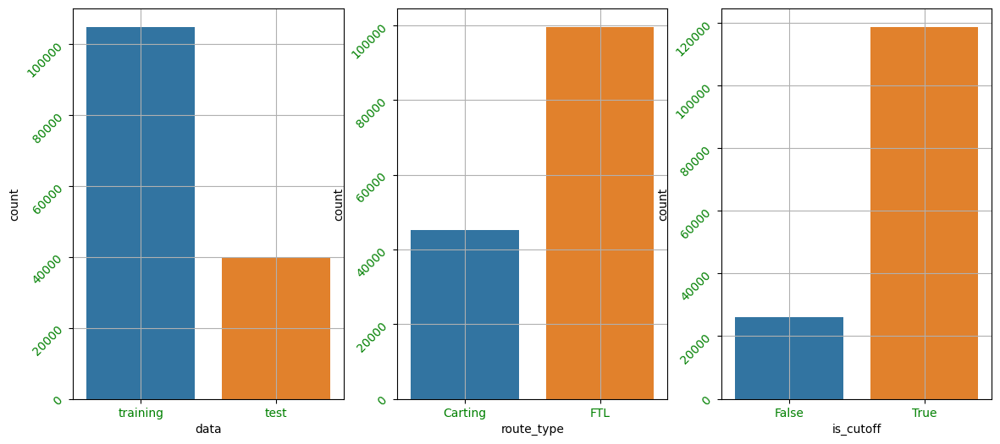

In [ ]:
plt.figure(figsize = (14, 6))
plt.subplot(131)
sns.countplot(x = 'data', data=df)
plt.xticks(rotation = 0, fontsize = 10, color = 'green')
plt.yticks(rotation = 45, fontsize = 10, color = 'green')
plt.grid()

plt.subplot(132)
sns.countplot(x = 'route_type', data=df)
plt.xticks(rotation = 0, fontsize = 10, color = 'green')
plt.yticks(rotation = 45, fontsize = 10, color = 'green')
plt.grid()

plt.subplot(133)
sns.countplot(x = 'is_cutoff', data=df)
plt.xticks(rotation = 0, fontsize = 10, color = 'green')
plt.yticks(rotation = 45, fontsize = 10, color = 'green')
plt.grid()

***1. Basic data cleaning and exploration:***

>Handle missing values in the data.

>Analyze the structure of the data.

>Try merging the rows using the hint mentioned above.

In [ ]:
A = df.groupby(['trip_uuid', 'source_center', 'source_name']).sum().reset_index().describe()
A

<ipython-input-21-78f403bcfb88>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  A = df.groupby(['trip_uuid', 'source_center', 'source_name']).sum().reset_index().describe()


,start_scan_to_end_scan,is_cutoff,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000,26309.000000
mean,5293.066441,4.513627,1282.579079,1288.893805,2295.755825,1177.637120,1568.055168,11.674088,199.309058,101.909347,125.704953,12.215150
std,24822.843002,9.294594,6504.722807,6519.733634,11250.511101,5899.826316,7974.979689,19.096357,381.826223,215.924665,286.297588,20.842845
min,22.000000,0.000000,9.000000,9.001351,9.000000,6.000000,9.072900,0.407895,9.000000,6.000000,9.072900,-0.454545
25%,206.000000,1.000000,46.000000,47.477501,92.000000,47.000000,56.553500,4.000000,50.000000,25.000000,28.509500,3.863919
50%,462.000000,2.000000,81.000000,83.570372,182.000000,90.000000,101.293000,6.337500,83.000000,42.000000,46.005500,6.443849
75%,1275.000000,4.000000,201.000000,205.177115,451.000000,219.000000,252.030600,10.841667,166.000000,79.000000,91.469900,11.503768
max,341880.000000,80.000000,84757.000000,85110.885093,167920.000000,76953.000000,102415.868000,307.205029,4504.000000,1938.000000,2640.924700,590.702381


In [ ]:
B = df.groupby(['trip_uuid', 'source_center', 'source_name']).cumsum().reset_index().describe()
B

<ipython-input-22-685f5aebe0c4>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.cumsum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  B = df.groupby(['trip_uuid', 'source_center', 'source_name']).cumsum().reset_index().describe()


,index,start_scan_to_end_scan,is_cutoff,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,144867.000000,144867.000000,144867.00000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000
mean,72433.000000,22834.614840,10.92275,4030.723277,4047.529019,6950.782456,3677.845348,4920.010428,21.632012,413.086314,242.869225,316.398321,20.984382
std,41819.645061,45369.140428,15.28729,9659.696147,9686.412015,16636.560929,8862.381339,11918.138288,29.721562,591.992728,357.539992,476.299701,28.655575
min,0.000000,20.000000,0.00000,9.000000,9.000045,9.000000,6.000000,9.008200,0.144000,9.000000,6.000000,9.008200,-16.615873
25%,36216.500000,330.000000,2.00000,27.000000,30.171136,82.000000,43.000000,45.689800,3.518182,51.000000,27.000000,30.430900,3.462865
50%,72433.000000,1542.000000,4.00000,132.000000,137.977742,320.000000,164.000000,181.510700,8.103571,131.000000,69.000000,81.993900,7.963969
75%,108649.500000,19449.000000,13.00000,2002.000000,2014.103197,3479.000000,1843.000000,2426.031650,26.072121,509.000000,295.000000,380.519050,25.452820
max,144866.000000,341880.000000,80.00000,84757.000000,85110.885093,167920.000000,76953.000000,102415.868000,307.205029,4504.000000,1938.000000,2640.924700,590.702381


In [ ]:
A = df.groupby(['trip_uuid']).sum().reset_index().describe()
A

<ipython-input-23-03c3a1843dd1>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  A = df.groupby(['trip_uuid']).sum().reset_index().describe()


,start_scan_to_end_scan,is_cutoff,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000,14817.000000
mean,9398.345482,8.014375,2277.341770,2288.554169,4076.333941,2091.007289,2784.231856,20.728458,353.892286,180.949787,223.201161,21.689166
std,33701.706672,13.361879,8776.824595,8798.110164,15216.870041,7956.882351,10759.101819,27.650018,556.247965,314.542047,416.628374,29.839290
min,26.000000,0.000000,9.000000,9.002461,9.000000,6.000000,9.072900,0.666667,9.000000,6.000000,9.072900,-0.184211
25%,408.000000,2.000000,48.000000,49.597866,142.000000,62.000000,65.738600,6.343860,66.000000,31.000000,32.654500,6.166667
50%,985.000000,4.000000,130.000000,134.059655,348.000000,167.000000,173.593600,10.954545,147.000000,65.000000,70.154400,11.231990
75%,2826.000000,8.000000,455.000000,463.956888,1063.000000,516.000000,607.677400,22.284977,367.000000,185.000000,218.802400,24.094546
max,396800.000000,98.000000,84757.000000,85110.885093,167920.000000,76953.000000,102415.868000,307.205029,6230.000000,2564.000000,3523.632400,609.127201


In [ ]:
B = df.groupby(['trip_uuid']).cumsum().reset_index().describe()
B

<ipython-input-24-4c0bc3fe0d1c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.cumsum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  B = df.groupby(['trip_uuid']).cumsum().reset_index().describe()


,index,start_scan_to_end_scan,is_cutoff,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000,144867.000000
mean,72433.000000,26246.728033,14.045835,4837.968475,4859.585949,8377.063286,4408.637875,5912.804385,28.877024,544.164503,314.435606,409.183902,28.629091
std,41819.645061,48634.377730,17.307157,10565.029667,10595.618569,18325.652745,9683.703115,13067.620528,34.105331,692.393649,406.309963,544.517561,34.102209
min,0.000000,22.000000,0.000000,9.000000,9.000045,9.000000,6.000000,9.051000,0.144000,9.000000,6.000000,9.051000,-16.615873
25%,36216.500000,620.000000,3.000000,66.000000,69.893125,160.000000,82.000000,92.468700,5.855429,82.000000,44.000000,50.329550,5.696674
50%,72433.000000,2644.000000,6.000000,330.000000,335.735635,669.000000,351.000000,419.293400,14.752056,242.000000,134.000000,159.916300,14.949834
75%,108649.500000,26895.500000,19.000000,3366.000000,3377.348803,5655.000000,2983.000000,3945.548150,38.562336,740.000000,419.000000,544.235500,38.638254
max,144866.000000,396800.000000,98.000000,84757.000000,85110.885093,167920.000000,76953.000000,102415.868000,307.205029,6230.000000,2564.000000,3523.632400,609.127201


**Build some features to prepare the data for actual analysis. Extract features from the below fields:**

>Destination Name: Split and extract features out of destination. City-place-code (State)

>Source Name: Split and extract features out of destination. City-place-code (State)

>Trip_creation_time: Extract features like month, year and day etc

In [ ]:
df['source_pin_code'] = df['source_center'].str[3:9]
df['source_place_code'] = df['source_center'].str[9:]
df['source_state'] = df['source_name'].str.extract(r'\((.*?)\)')

df['destinaton_pin_code'] = df['destination_center'].str[3:9]
df['destination_place_code'] = df['destination_center'].str[9:]
df['destination_state'] = df['destination_name'].str.extract(r'\((.*?)\)')

In [ ]:
# Convert datetime columns to datetime data type
datetime_columns_to_convert = ['trip_creation_time', 'od_start_time', 'od_end_time']
df[datetime_columns_to_convert] = df[datetime_columns_to_convert].apply(pd.to_datetime)
print(df.dtypes)

data                                      object
trip_creation_time                datetime64[ns]
route_schedule_uuid                       object
route_type                                object
trip_uuid                                 object
source_center                             object
source_name                               object
destination_center                        object
destination_name                          object
od_start_time                     datetime64[ns]
od_end_time                       datetime64[ns]
start_scan_to_end_scan                   float64
is_cutoff                                   bool
cutoff_factor                              int64
cutoff_timestamp                          object
actual_distance_to_destination           float64
actual_time                              float64
osrm_time                                float64
osrm_distance                            float64
factor                                   float64
segment_actual_time 

In [ ]:
df['Total_time_dispatch_to_delivary'] = df['od_end_time'] - df['od_start_time']
df['Total_time_dispatch_to_delivary'].head()

0   0 days 01:26:12.818197
1   0 days 01:26:12.818197
2   0 days 01:26:12.818197
3   0 days 01:26:12.818197
4   0 days 01:26:12.818197
Name: Total_time_dispatch_to_delivary, dtype: timedelta64[ns]

In [ ]:
# sns.pairplot(df)
# plt.show()

# sns.pairplot(df, hue = 'data')
# plt.show()

# sns.pairplot(df, hue = 'route_type')
# plt.show()

# sns.pairplot(df, hue = 'is_cutoff')
# plt.show()

In [ ]:
df.groupby(df['Total_time_dispatch_to_delivary']).count()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor,source_pin_code,source_place_code,source_state,destinaton_pin_code,destination_place_code,destination_state
Total_time_dispatch_to_delivary,,,,,,,,,,,,,,,,,,,,,
0 days 00:20:42.168787,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
0 days 00:21:06.457908,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
0 days 00:22:59.781538,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
0 days 00:23:07.088792,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
0 days 00:23:27.688109,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2 days 22:07:13.446025,75,75,75,75,75,75,75,75,75,75,...,75,75,75,75,75,75,75,75,75,75
2 days 22:39:27.270943,60,60,60,60,60,60,60,60,60,60,...,60,60,60,60,60,60,60,60,60,60
3 days 02:00:56.313994,77,77,77,77,77,77,77,77,77,77,...,77,77,77,77,77,77,77,77,77,77


In [ ]:
df['Total_time_dispatch_to_delivary'].min(), df['Total_time_dispatch_to_delivary'].max()

(Timedelta('0 days 00:20:42.168787'), Timedelta('5 days 11:38:33.117274'))

In [ ]:
df['Total_time_dispatch_to_delivary'].dtypes

dtype('<m8[ns]')

In [ ]:
pd.to_timedelta(df['Total_time_dispatch_to_delivary'])
df['Total_time_taken_days'] = df['Total_time_dispatch_to_delivary'].dt.days
df['Total_time_taken_hours'] = df['Total_time_dispatch_to_delivary'].dt.components.hours
df['Total_time_taken_minutes'] = df['Total_time_dispatch_to_delivary'].dt.components.minutes

In [ ]:
df.dtypes

data                                        object
trip_creation_time                  datetime64[ns]
route_schedule_uuid                         object
route_type                                  object
trip_uuid                                   object
source_center                               object
source_name                                 object
destination_center                          object
destination_name                            object
od_start_time                       datetime64[ns]
od_end_time                         datetime64[ns]
start_scan_to_end_scan                     float64
is_cutoff                                     bool
cutoff_factor                                int64
cutoff_timestamp                            object
actual_distance_to_destination             float64
actual_time                                float64
osrm_time                                  float64
osrm_distance                              float64
factor                         

In [ ]:
df['trip_creation_date'] = df['trip_creation_time'].dt.day
df['trip_creation_month'] = df['trip_creation_time'].dt.month
df['trip_creation_year'] = df['trip_creation_time'].dt.year
df['trip_creation_hour'] = df['trip_creation_time'].dt.hour
df['trip_creation_week'] = df['trip_creation_time'].dt.week

df['Trip_start_date'] = df['od_start_time'].dt.day
df['Trip_start_month'] = df['od_start_time'].dt.month
df['Trip_start_year'] = df['od_start_time'].dt.year
df['Trip_start_hour'] = df['od_start_time'].dt.hour
df['Trip_start_week'] = df['od_start_time'].dt.week

df['Trip_end_date'] = df['od_end_time'].dt.day
df['Trip_end_month'] = df['od_end_time'].dt.month
df['Trip_end_year'] = df['od_end_time'].dt.year
df['Trip_end_hour'] = df['od_end_time'].dt.hour
df['Trip_end_week'] = df['od_end_time'].dt.week

df['Trip_end_date'] = df['od_end_time'].dt.day
df['Trip_end_month'] = df['od_end_time'].dt.month
df['Trip_end_year'] = df['od_end_time'].dt.year
df['Trip_end_hour'] = df['od_end_time'].dt.hour
df['Trip_end_week'] = df['od_end_time'].dt.week

<ipython-input-34-d366afe06d6d>:5: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['trip_creation_week'] = df['trip_creation_time'].dt.week
<ipython-input-34-d366afe06d6d>:11: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['Trip_start_week'] = df['od_start_time'].dt.week
<ipython-input-34-d366afe06d6d>:17: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['Trip_end_week'] = df['od_end_time'].dt.week
<ipython-input-34-d366afe06d6d>:23: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['Trip_end_week'] = df['od_end_time'].dt.week


In [ ]:
df['start_scan_to_end_scan']

0          86.0
1          86.0
2          86.0
3          86.0
4          86.0
          ...  
144862    427.0
144863    427.0
144864    427.0
144865    427.0
144866    427.0
Name: start_scan_to_end_scan, Length: 144867, dtype: float64

In [ ]:
# float_cols = df.select_dtypes(include=['float']).columns
# df[float_cols] = df[float_cols].astype(int)
# df.dtypes

In [ ]:
df.shape

(144867, 49)

In [ ]:
print("trip_creation_year:")
print("Min:", df['trip_creation_year'].min(), "Max:", df['trip_creation_year'].max())
print("\nTrip_end_year:")
print("Min:", df['Trip_end_year'].min(), "Max:", df['Trip_end_year'].max())
print("\nstart_scan_to_end_scan_year:")
print("Min:", df['start_scan_to_end_scan'].min(), "Max:", df['start_scan_to_end_scan'].max())

trip_creation_year:
Min: 2018 Max: 2018

Trip_end_year:
Min: 2018 Max: 2018

start_scan_to_end_scan_year:
Min: 20.0 Max: 7898.0


In [ ]:
print("\ntrip_creation_month:")
print("Min:", df['trip_creation_month'].min(), "Max:", df['trip_creation_month'].max())
print("\nTrip_end_month:")
print("Min:", df['Trip_end_month'].min(), "Max:", df['Trip_end_month'].max())
print("\nTrip_end_month:")
print("Min:", df['Trip_end_month'].min(), "Max:", df['Trip_end_month'].max())


trip_creation_month:
Min: 9 Max: 10

Trip_end_month:
Min: 9 Max: 10

Trip_end_month:
Min: 9 Max: 10


In [ ]:
df.head(5)

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,Trip_start_date,Trip_start_month,Trip_start_year,Trip_start_hour,Trip_start_week,Trip_end_date,Trip_end_month,Trip_end_year,Trip_end_hour,Trip_end_week
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,2018,3,38,20,9,2018,4,38
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,2018,3,38,20,9,2018,4,38
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,2018,3,38,20,9,2018,4,38
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,2018,3,38,20,9,2018,4,38
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,2018,3,38,20,9,2018,4,38


In [ ]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor',
       'source_pin_code', 'source_place_code', 'source_state',
       'destinaton_pin_code', 'destination_place_code', 'destination_state',
       'Total_time_dispatch_to_delivary', 'Total_time_taken_days',
       'Total_time_taken_hours', 'Total_time_taken_minutes',
       'trip_creation_date', 'trip_creation_month', 'trip_creation_year',
       'trip_creation_hour', 'trip_creation_week', 'Trip_start_date',
       'Trip_start_month', 'Trip_start_year', 'Trip_start_hour',
       'Trip_start_week', 'Trip_end_

In-depth analysis and feature engineering:

>Calculate the time taken between od_start_time and od_end_time and keep it as a feature. Drop the original columns, if required
Compare the difference between Point a. and start_scan_to_end_scan. Do hypothesis testing/ Visual analysis to check.

>Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

>Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

>Do hypothesis testing/ visual analysis between osrm distance aggregated value and segment osrm distance aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

>Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

>Find outliers in the numerical variables (you might find outliers in almost all the variables), and check it using visual analysis. Handle the outliers using the IQR method.

>Do one-hot encoding of categorical variables (like route_type)
Normalize/ Standardize the numerical features using MinMaxScaler or StandardScaler.

In [ ]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor',
       'source_pin_code', 'source_place_code', 'source_state',
       'destinaton_pin_code', 'destination_place_code', 'destination_state',
       'Total_time_dispatch_to_delivary', 'Total_time_taken_days',
       'Total_time_taken_hours', 'Total_time_taken_minutes',
       'trip_creation_date', 'trip_creation_month', 'trip_creation_year',
       'trip_creation_hour', 'trip_creation_week', 'Trip_start_date',
       'Trip_start_month', 'Trip_start_year', 'Trip_start_hour',
       'Trip_start_week', 'Trip_end_

In [ ]:
df.shape

(144867, 49)

In [ ]:
df.dtypes

data                                        object
trip_creation_time                  datetime64[ns]
route_schedule_uuid                         object
route_type                                  object
trip_uuid                                   object
source_center                               object
source_name                                 object
destination_center                          object
destination_name                            object
od_start_time                       datetime64[ns]
od_end_time                         datetime64[ns]
start_scan_to_end_scan                     float64
is_cutoff                                     bool
cutoff_factor                                int64
cutoff_timestamp                            object
actual_distance_to_destination             float64
actual_time                                float64
osrm_time                                  float64
osrm_distance                              float64
factor                         

In [ ]:
df['start_scan_to_end_scan']

0          86.0
1          86.0
2          86.0
3          86.0
4          86.0
          ...  
144862    427.0
144863    427.0
144864    427.0
144865    427.0
144866    427.0
Name: start_scan_to_end_scan, Length: 144867, dtype: float64

In [ ]:
df['Total_time_dispatch_to_delivary']

0        0 days 01:26:12.818197
1        0 days 01:26:12.818197
2        0 days 01:26:12.818197
3        0 days 01:26:12.818197
4        0 days 01:26:12.818197
                  ...          
144862   0 days 07:07:41.181838
144863   0 days 07:07:41.181838
144864   0 days 07:07:41.181838
144865   0 days 07:07:41.181838
144866   0 days 07:07:41.181838
Name: Total_time_dispatch_to_delivary, Length: 144867, dtype: timedelta64[ns]

In [ ]:
df['Total_time_dispatch_to_delivary'] = df['Total_time_dispatch_to_delivary'].apply(lambda delta: float(delta.total_seconds()))
df['Total_time_dispatch_to_delivary'].round(2)

0          5172.82
1          5172.82
2          5172.82
3          5172.82
4          5172.82
            ...   
144862    25661.18
144863    25661.18
144864    25661.18
144865    25661.18
144866    25661.18
Name: Total_time_dispatch_to_delivary, Length: 144867, dtype: float64

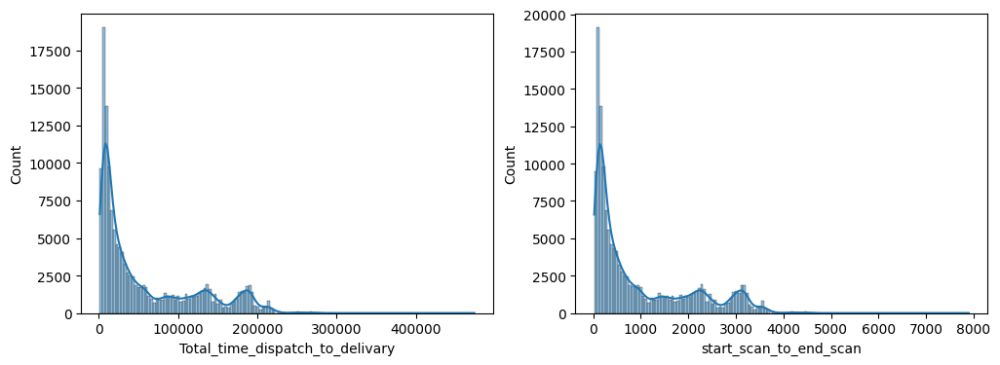

In [ ]:
plt.figure(figsize = (12, 4))
plt.subplot(121)
sns.histplot(df['Total_time_dispatch_to_delivary'], kde=True)

plt.subplot(122)
sns.histplot(df['start_scan_to_end_scan'], kde=True)
plt.show()

In [ ]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor',
       'source_pin_code', 'source_place_code', 'source_state',
       'destinaton_pin_code', 'destination_place_code', 'destination_state',
       'Total_time_dispatch_to_delivary', 'Total_time_taken_days',
       'Total_time_taken_hours', 'Total_time_taken_minutes',
       'trip_creation_date', 'trip_creation_month', 'trip_creation_year',
       'trip_creation_hour', 'trip_creation_week', 'Trip_start_date',
       'Trip_start_month', 'Trip_start_year', 'Trip_start_hour',
       'Trip_start_week', 'Trip_end_

*Compare the difference between Point a. and start_scan_to_end_scan. Do hypothesis testing/ Visual analysis to check.*

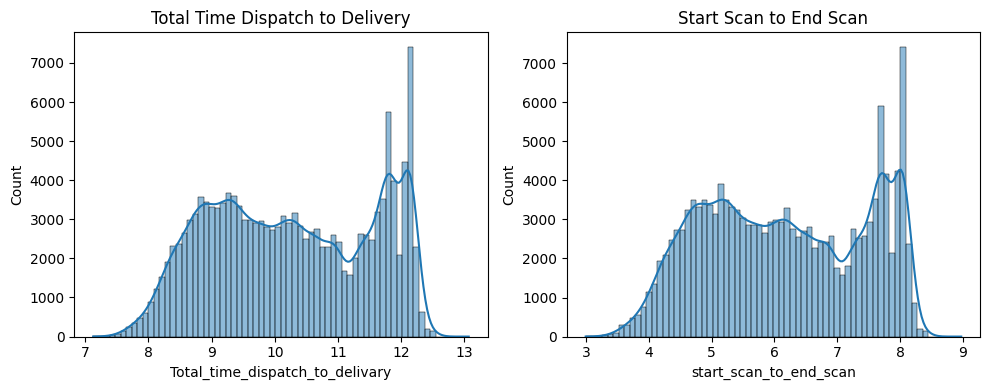

In [ ]:
plt.figure(figsize=(10, 4))

plt.subplot(121)
sns.histplot(np.log(df["Total_time_dispatch_to_delivary"]), kde=True)
plt.title("Total Time Dispatch to Delivery")

plt.subplot(122)
sns.histplot(np.log(df["start_scan_to_end_scan"]), kde=True)
plt.title("Start Scan to End Scan")

plt.tight_layout()  # To prevent overlapping titles and labels
plt.show()

**Shapiro-Wilk Test** - Tests whether a data sample has a Gaussian distribution.

*Assumptions* -  Observations in each sample are independent and identically distributed (iid).

*Interpretation*
>H0: the sample has a Gaussian distribution.

>H1: the sample does not have a Gaussian distribution.

In [ ]:
from scipy.stats import shapiro
# Shapiro-Wilk normality test on the original data
stat, p = shapiro(df["Total_time_dispatch_to_delivary"])
print('Original data:')
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably Gaussian')
else:
    print('Probably not Gaussian')

# Shapiro-Wilk normality test after log transformation
stat, p = shapiro(np.log(df["Total_time_dispatch_to_delivary"]))
print('\nLog-transformed data:')
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably Gaussian')
else:
    print('Probably not Gaussian')

Original data:
stat=0.805, p=0.000
Probably not Gaussian

Log-transformed data:
stat=0.949, p=0.000
Probably not Gaussian


/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
stat, p = shapiro(df["start_scan_to_end_scan"])
print('Original data:')
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably Gaussian')
else:
    print('Probably not Gaussian')

# Shapiro-Wilk normality test after log transformation
stat, p = shapiro(np.log(df["start_scan_to_end_scan"]))
print('\nLog-transformed data:')
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably Gaussian')
else:
    print('Probably not Gaussian')

Original data:
stat=0.805, p=0.000
Probably not Gaussian

Log-transformed data:
stat=0.949, p=0.000
Probably not Gaussian


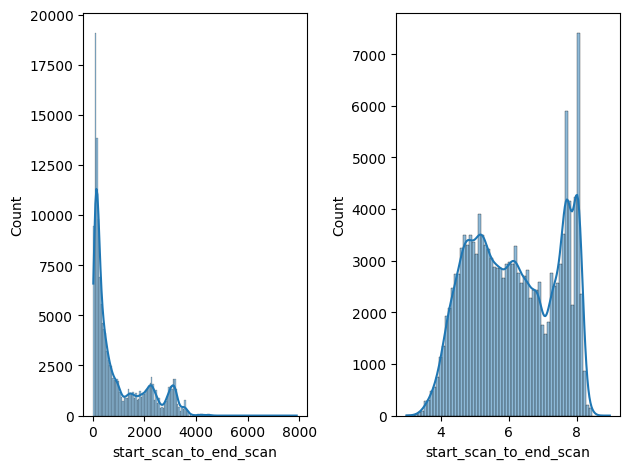

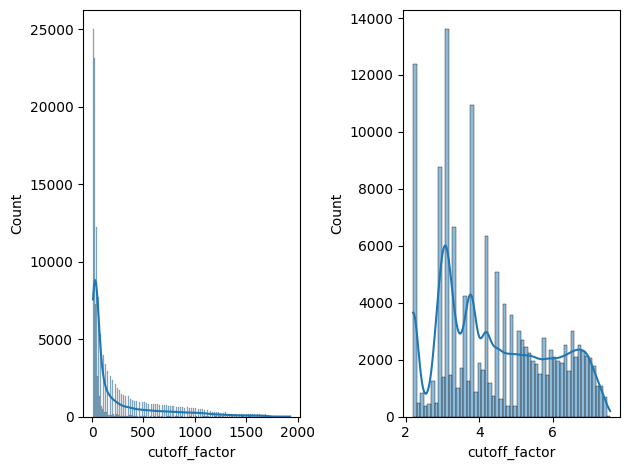

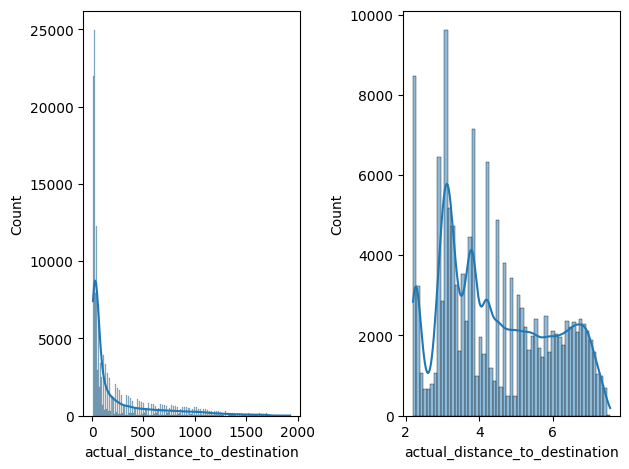

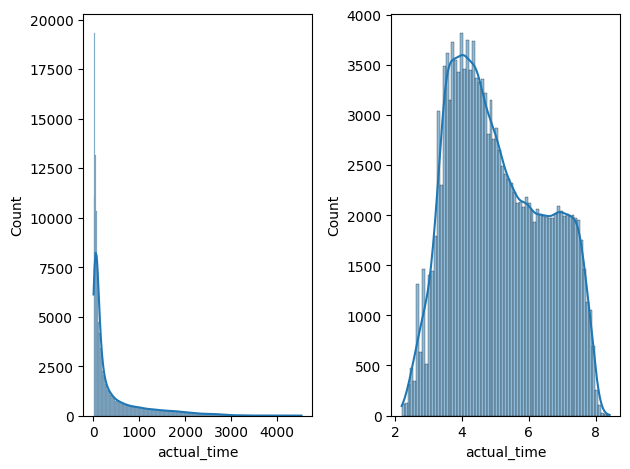

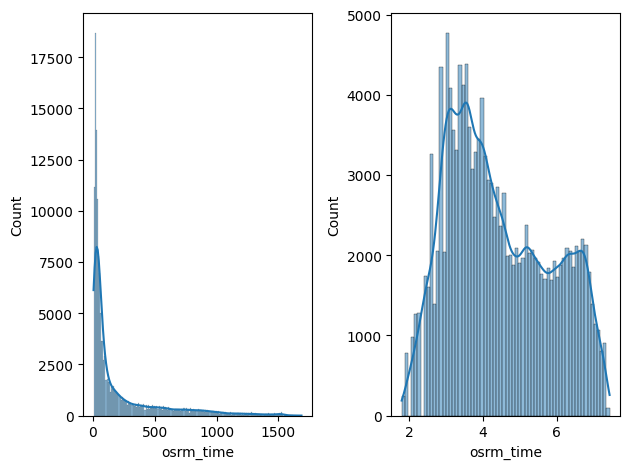

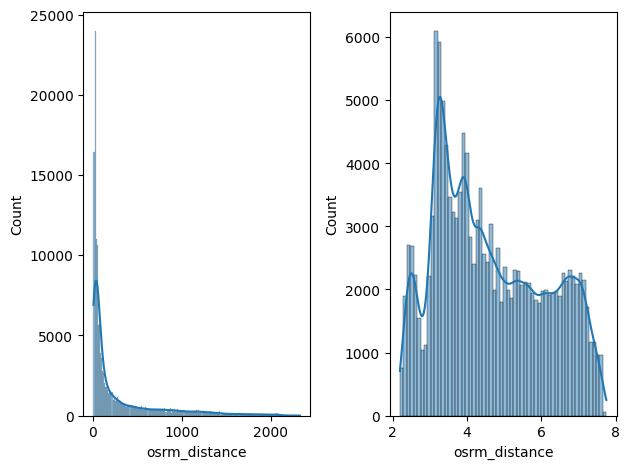

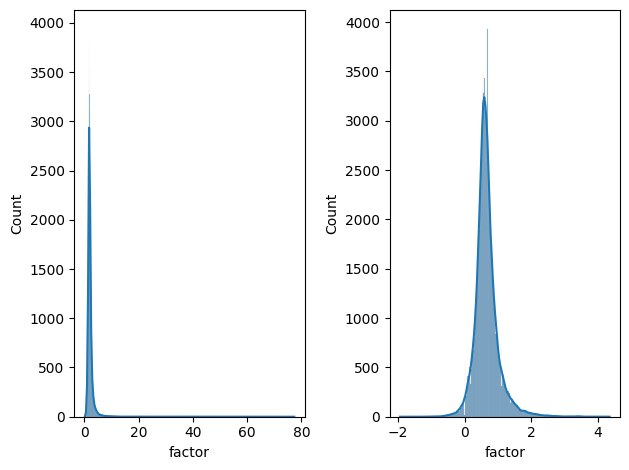

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


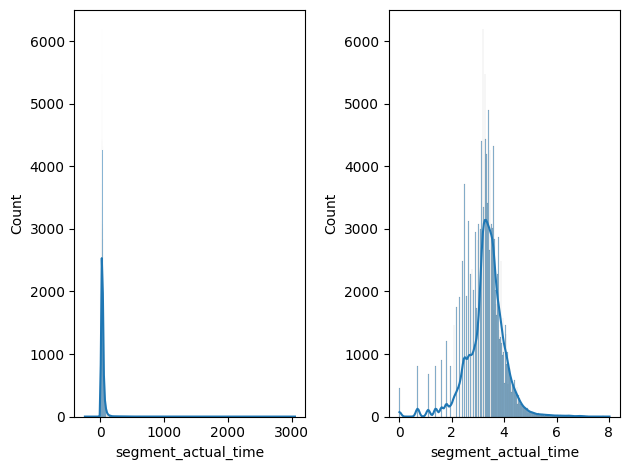

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


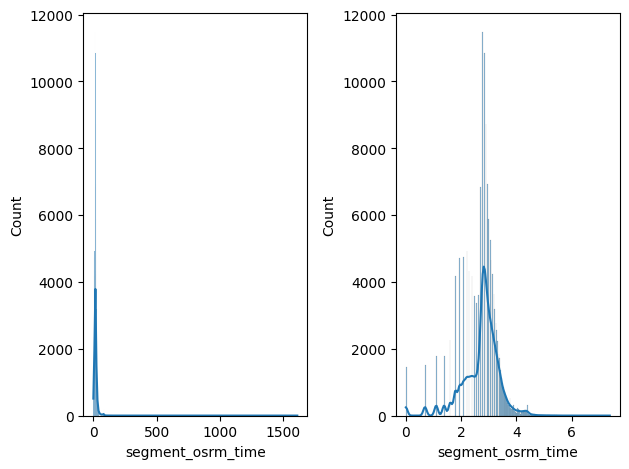

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


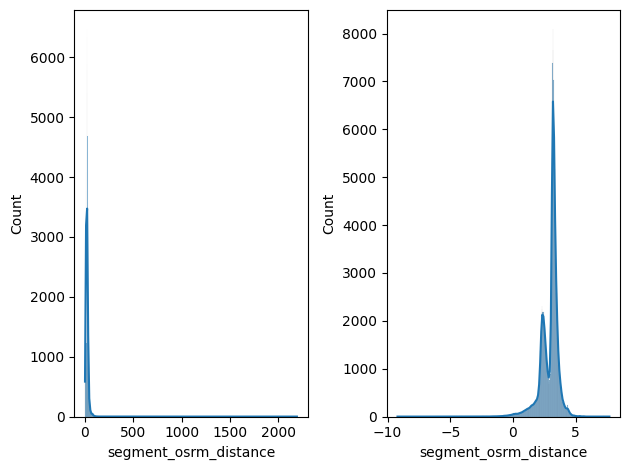

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


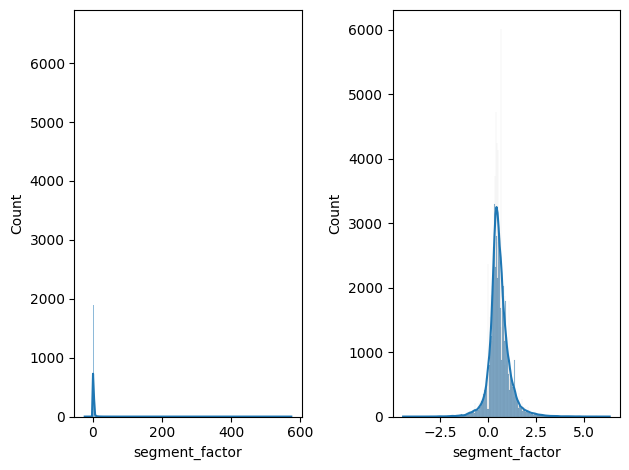

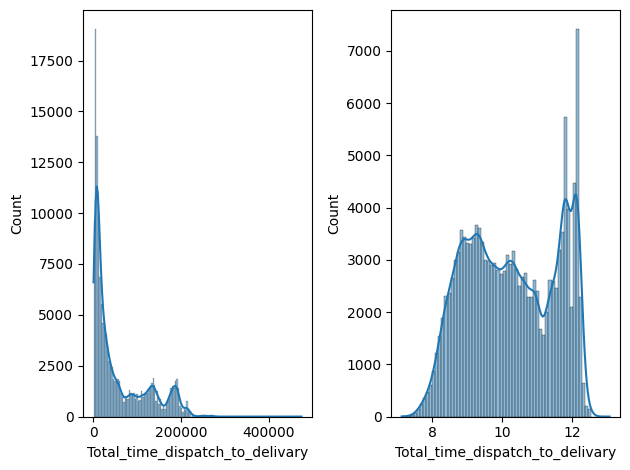

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


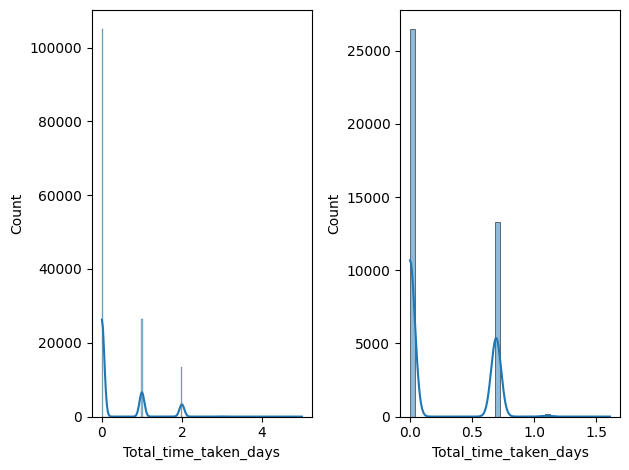

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


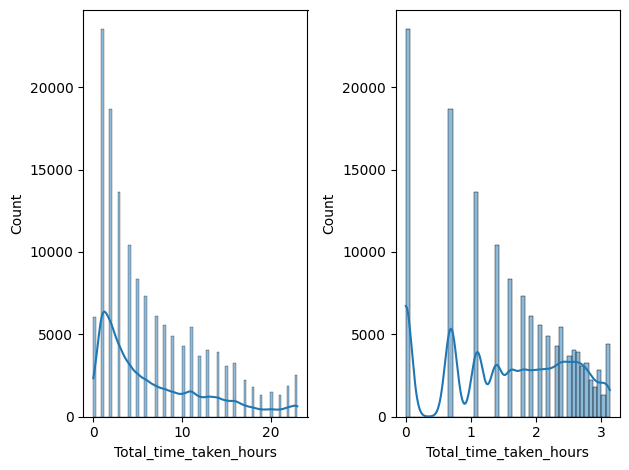

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


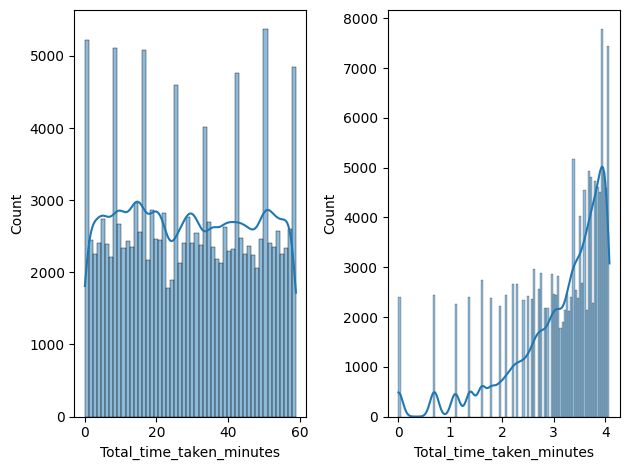

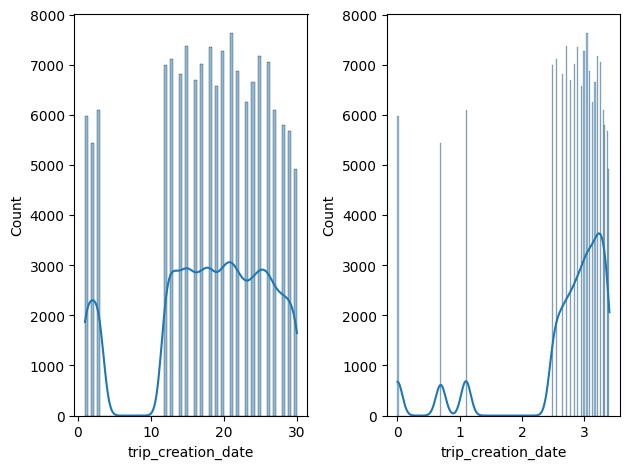

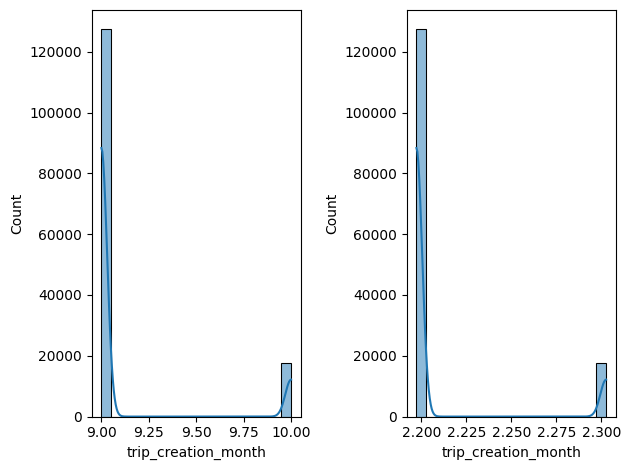

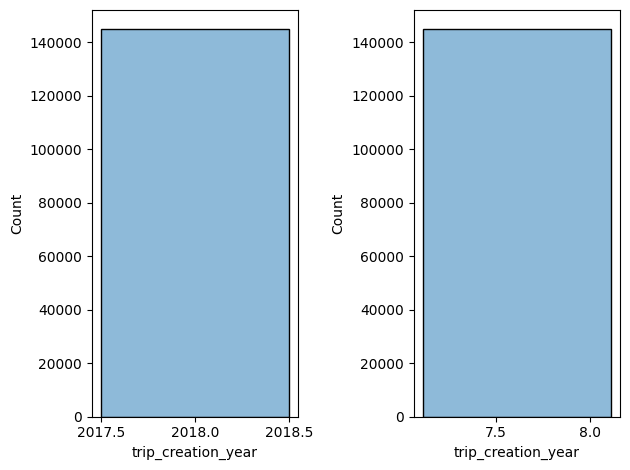

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


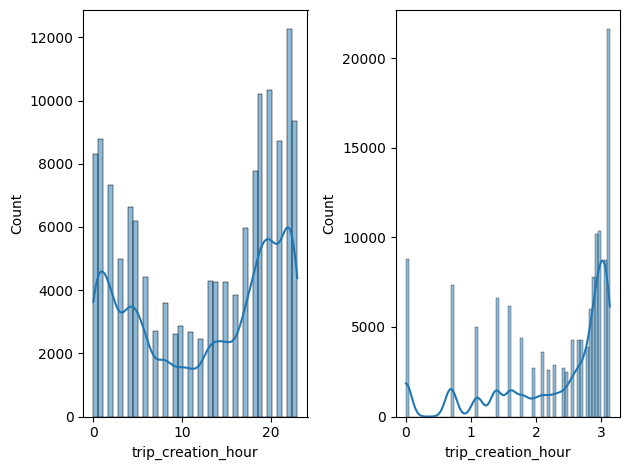

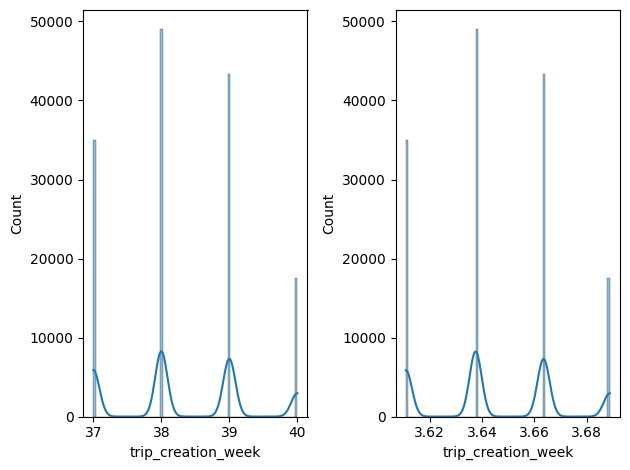

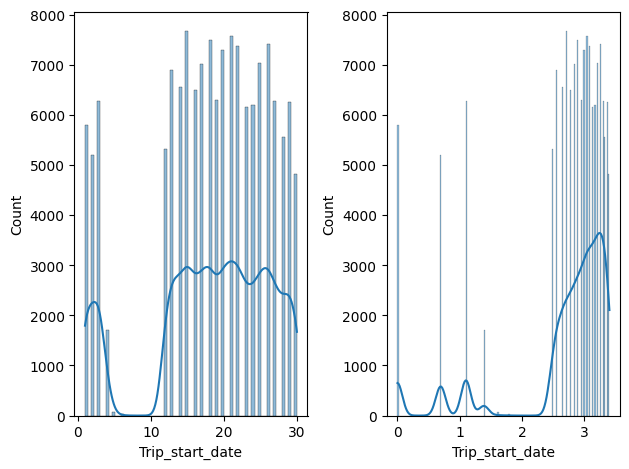

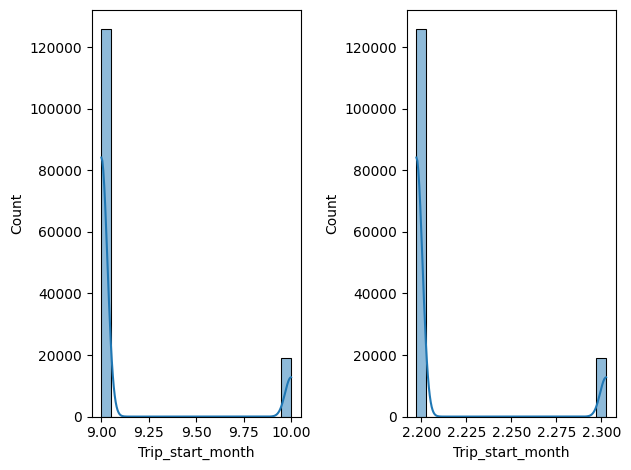

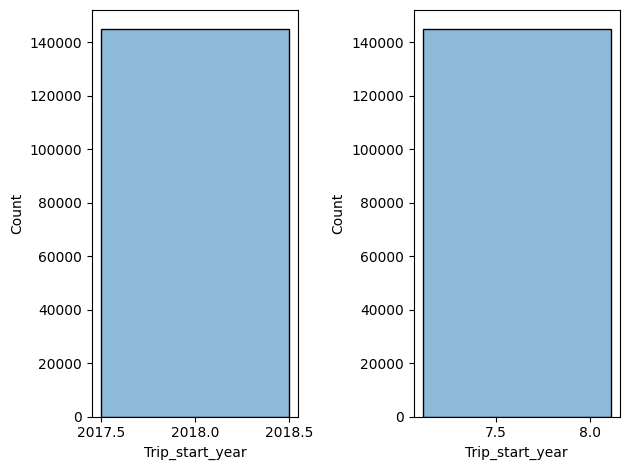

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


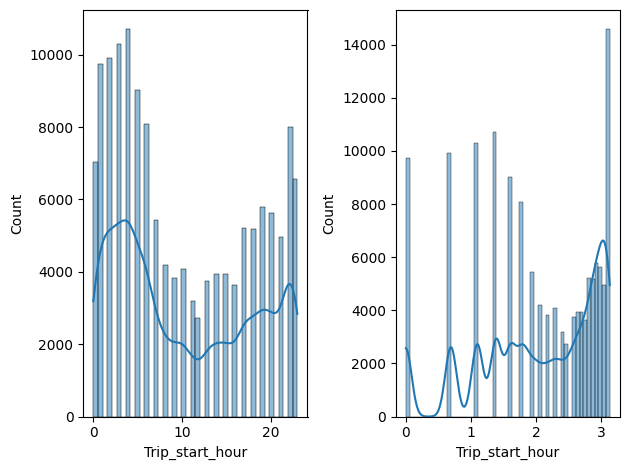

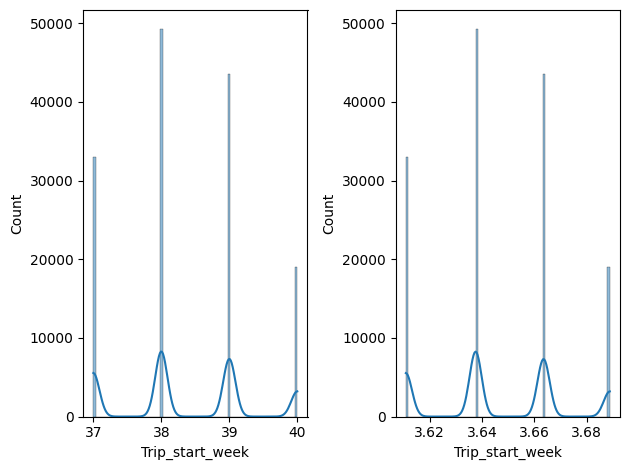

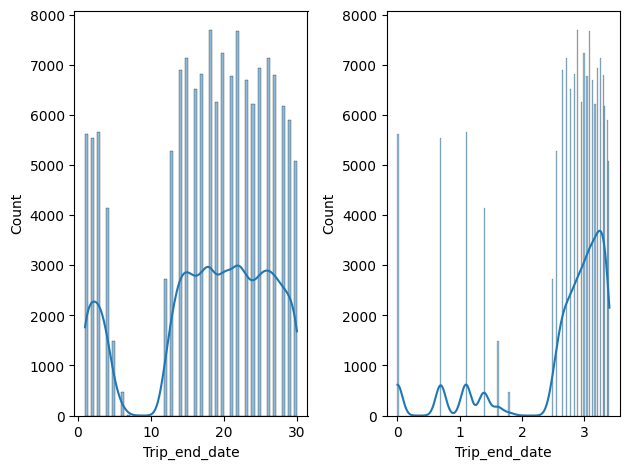

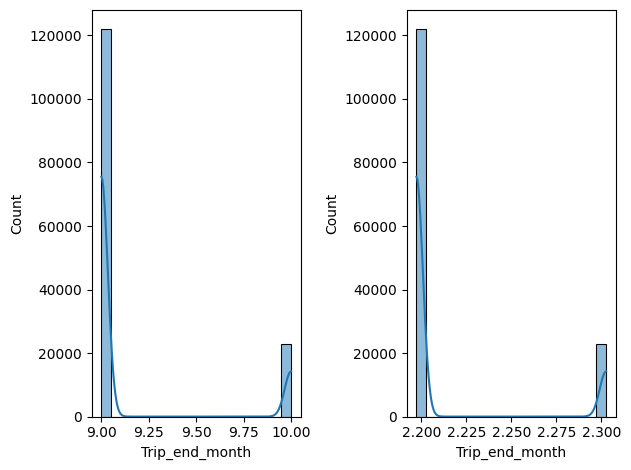

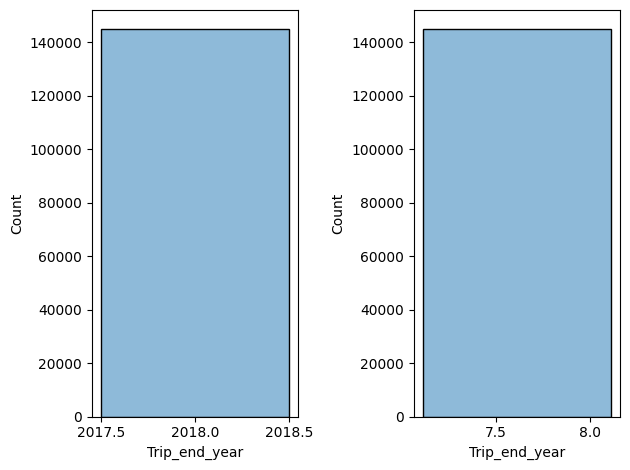

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


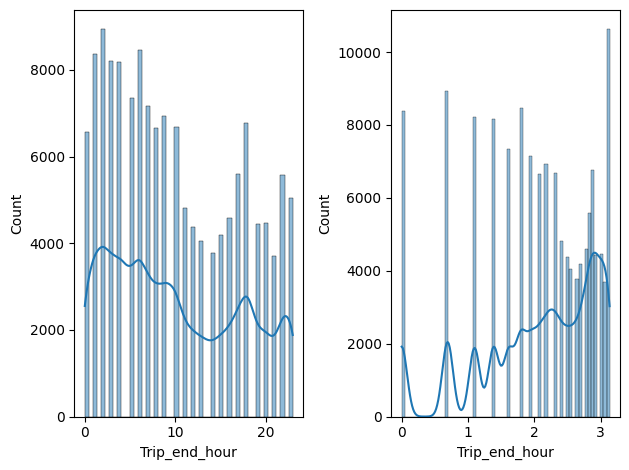

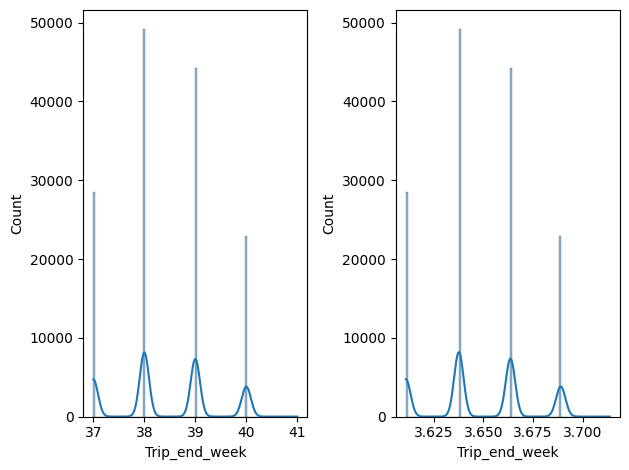

In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

for col in numeric_columns:
  plt.subplot(121)
  sns.histplot(df[col], kde=True)

  plt.subplot(122)
  sns.histplot(np.log(df[col]), kde=True)

  plt.tight_layout()
  plt.show()

In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

gaussian_columns = []
nongaussian_columns = []
for col in numeric_columns:
    stat, p = shapiro(df[col])
    print('\nColumn:', col)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
        gaussian_columns.append(col)
    else:
        nongaussian_columns.append(col)

print("Columns with Gaussian distributions:", gaussian_columns)
print("Columns with non-Gaussian distributions:", nongaussian_columns)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1813: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "



Column: start_scan_to_end_scan
stat=0.805, p=0.000

Column: cutoff_factor
stat=0.681, p=0.000

Column: actual_distance_to_destination
stat=0.681, p=0.000

Column: actual_time
stat=0.688, p=0.000

Column: osrm_time
stat=0.684, p=0.000

Column: osrm_distance
stat=0.678, p=0.000

Column: factor
stat=0.314, p=0.000

Column: segment_actual_time
stat=0.308, p=0.000

Column: segment_osrm_time
stat=0.597, p=0.000

Column: segment_osrm_distance
stat=0.567, p=0.000

Column: segment_factor
stat=0.149, p=0.000

Column: Total_time_dispatch_to_delivary
stat=0.805, p=0.000

Column: Total_time_taken_days
stat=0.600, p=0.000

Column: Total_time_taken_hours
stat=0.871, p=0.000

Column: Total_time_taken_minutes
stat=0.952, p=0.000

Column: trip_creation_date
stat=0.925, p=0.000

Column: trip_creation_month
stat=0.381, p=0.000

Column: trip_creation_year
stat=1.000, p=1.000

Column: trip_creation_hour
stat=0.888, p=0.000

Column: trip_creation_week
stat=0.874, p=0.000

Column: Trip_start_date
stat=0.923,

In [ ]:
gaussian_columns = []
nongaussian_columns = []

for col in numeric_columns:
    # Shapiro-Wilk normality test after log transformation
    stat, p = shapiro(np.log(df[col]))

    print('\nColumn:', col)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
        gaussian_columns.append(col)
    else:
        nongaussian_columns.append(col)

print("\nColumns with Gaussian distributions:", gaussian_columns)
print("Columns with non-Gaussian distributions:", nongaussian_columns)


Column: start_scan_to_end_scan
stat=0.949, p=0.000

Column: cutoff_factor
stat=0.943, p=0.000

Column: actual_distance_to_destination
stat=0.944, p=0.000

Column: actual_time
stat=0.963, p=0.000

Column: osrm_time
stat=0.956, p=0.000

Column: osrm_distance
stat=0.949, p=0.000

Column: factor
stat=0.887, p=0.000

Column: segment_actual_time
stat=nan, p=1.000

Column: segment_osrm_time
stat=nan, p=1.000

Column: segment_osrm_distance
stat=nan, p=1.000

Column: segment_factor
stat=nan, p=1.000

Column: Total_time_dispatch_to_delivary
stat=0.949, p=0.000

Column: Total_time_taken_days
stat=nan, p=1.000

Column: Total_time_taken_hours
stat=nan, p=1.000

Column: Total_time_taken_minutes
stat=nan, p=1.000

Column: trip_creation_date
stat=0.681, p=0.000

Column: trip_creation_month
stat=0.381, p=0.000

Column: trip_creation_year
stat=1.000, p=1.000

Column: trip_creation_hour
stat=nan, p=1.000

Column: trip_creation_week
stat=0.876, p=0.000

Column: Trip_start_date
stat=0.691, p=0.000

Column

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1805: RuntimeWarning: invalid value encountered in subtract
  x = x - np.median(x)


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,data,trip_creation_time,route_schedule_uuid,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,...,Trip_start_year,Trip_start_hour,Trip_start_week,Trip_end_date,Trip_end_month,Trip_end_year,Trip_end_hour,Trip_end_week,route_type_FTL,is_cutoff_True
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,2.029445,0.094048,38,20,9,2.029445,0.326634,38,0,1
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,2.029445,0.094048,38,20,9,2.029445,0.326634,38,0,1
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,2.029445,0.094048,38,20,9,2.029445,0.326634,38,0,1
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,2.029445,0.094048,38,20,9,2.029445,0.326634,38,0,1
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,2.029445,0.094048,38,20,9,2.029445,0.326634,38,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144857,training,2018-09-17 11:35:28.838714,thanos::sroute:d8f74492-4484-412a-887a-61c8e6b...,trip-153718412883843340,IND600056AAB,MAA_Poonamallee_HB (Tamil Nadu),IND600032AAB,Chennai_Hub (Tamil Nadu),2018-09-17 11:35:28.838714,2018-09-17 13:32:21.128357,...,2.029445,0.874591,38,17,9,2.029445,0.941939,38,0,0
144858,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,2.029445,1.019781,38,20,9,2.029445,1.142787,38,0,1
144861,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,2.029445,1.019781,38,20,9,2.029445,1.142787,38,0,1
144862,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,2.029445,1.019781,38,20,9,2.029445,1.142787,38,0,1


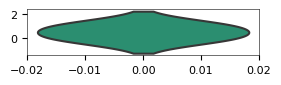

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['start_scan_to_end_scan'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['cutoff_factor'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['actual_distance_to_destination'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['start_scan_to_end_scan'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['cutoff_factor'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['actual_distance_to_destination'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df, *['data'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df, *[[['start_scan_to_end_scan', 'cutoff_factor'], ['cutoff_factor', 'actual_distance_to_destination'], ['actual_distance_to_destination', 'actual_time'], ['actual_time', 'osrm_time']]], **{})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['start_scan_to_end_scan', 'data'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['cutoff_factor', 'data'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['actual_distance_to_destination', 'data'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['actual_time', 'data'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['trip_creation_time', 'start_scan_to_end_scan', 'data'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['trip_creation_time', 'cutoff_factor', 'data'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['trip_creation_time', 'actual_distance_to_destination', 'data'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['trip_creation_time', 'osrm_distance', 'data'], **{})
chart

In [ ]:
for col in gaussian_columns:
    df[col] = np.log(df[col])
df

*Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)*

In [ ]:
df['actual_time']

0          14.0
1          24.0
2          40.0
3          62.0
4          68.0
          ...  
144862     94.0
144863    120.0
144864    140.0
144865    158.0
144866    426.0
Name: actual_time, Length: 144867, dtype: float64

In [ ]:
df['osrm_time']

0         11.0
1         20.0
2         28.0
3         40.0
4         44.0
          ... 
144862    60.0
144863    76.0
144864    88.0
144865    98.0
144866    95.0
Name: osrm_time, Length: 144867, dtype: float64

In [ ]:
A = df.groupby('trip_uuid')['actual_time', 'osrm_time'].sum().reset_index()
A['time_lag'] = A['actual_time'] - df['osrm_time']
A

<ipython-input-76-3f42e218d504>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  A = df.groupby('trip_uuid')['actual_time', 'osrm_time'].sum().reset_index()


,trip_uuid,actual_time,osrm_time,time_lag
0,trip-153671402673350359,628.0,454.0,617.0
1,trip-153671437849482795,861.0,431.0,841.0
2,trip-153671440490445199,299.0,146.0,271.0
3,trip-153671448965568596,320.0,157.0,280.0
4,trip-153671453267549065,328.0,179.0,284.0
...,...,...,...,...
9481,trip-153834197220767217,100.0,66.0,59.0
9482,trip-153834226529969489,120.0,93.0,NaN
9483,trip-153834234833309895,96.0,71.0,72.0
9484,trip-153834351429176533,69.0,47.0,10.0


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(A, *[[['actual_time', 'osrm_time'], ['osrm_time', 'time_lag']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['actual_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['osrm_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['time_lag', 'count()', None], **{})
chart

*Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)*

In [ ]:
A = df.groupby('trip_uuid')['osrm_time', 'segment_osrm_time'].sum().reset_index()
A['time_lag'] = A['osrm_time'] - df['segment_osrm_time']
A

<ipython-input-77-55deeec49d4b>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  A = df.groupby('trip_uuid')['osrm_time', 'segment_osrm_time'].sum().reset_index()


,trip_uuid,osrm_time,segment_osrm_time,time_lag
0,trip-153671402673350359,454.0,6.442425,453.125409
1,trip-153671437849482795,431.0,12.147260,430.212805
2,trip-153671440490445199,146.0,4.643226,145.334270
3,trip-153671448965568596,157.0,4.008468,156.089765
4,trip-153671453267549065,179.0,5.169801,178.524115
...,...,...,...,...
9481,trip-153834197220767217,66.0,2.292415,65.212805
9482,trip-153834226529969489,93.0,2.720520,NaN
9483,trip-153834234833309895,71.0,2.693659,69.843731
9484,trip-153834351429176533,47.0,1.845929,45.739734


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['segment_osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['segment_osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(A, *[[['osrm_time', 'segment_osrm_time'], ['segment_osrm_time', 'time_lag']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['osrm_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['segment_osrm_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['time_lag', 'count()', None], **{})
chart

*Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)*

In [ ]:
A = df.groupby('trip_uuid')['actual_time', 'segment_actual_time'].sum().reset_index()
A['time_lag'] = A['actual_time'] - df['segment_actual_time']
A

<ipython-input-78-98ea8f4e424b>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  A = df.groupby('trip_uuid')['actual_time', 'segment_actual_time'].sum().reset_index()


,trip_uuid,actual_time,segment_actual_time,time_lag
0,trip-153671402673350359,628.0,7.033484,627.029578
1,trip-153671437849482795,861.0,16.294806,860.165968
2,trip-153671440490445199,299.0,5.228878,297.980219
3,trip-153671448965568596,320.0,4.962497,318.886656
4,trip-153671453267549065,328.0,6.078926,327.416802
...,...,...,...,...
9481,trip-153834197220767217,100.0,2.804330,98.701564
9482,trip-153834226529969489,120.0,3.425758,NaN
9483,trip-153834234833309895,96.0,3.029347,94.708680
9484,trip-153834351429176533,69.0,2.328059,67.546826


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['segment_actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['segment_actual_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(A, *[[['actual_time', 'segment_actual_time'], ['segment_actual_time', 'time_lag']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['actual_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['segment_actual_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['time_lag', 'count()', None], **{})
chart

*Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)*

In [ ]:
A = df.groupby('trip_uuid')['osrm_time', 'segment_osrm_time'].sum().reset_index()
A['time_lag'] = A['osrm_time'] - df['segment_osrm_time']
A

<ipython-input-79-55deeec49d4b>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  A = df.groupby('trip_uuid')['osrm_time', 'segment_osrm_time'].sum().reset_index()


,trip_uuid,osrm_time,segment_osrm_time,time_lag
0,trip-153671402673350359,454.0,6.442425,453.125409
1,trip-153671437849482795,431.0,12.147260,430.212805
2,trip-153671440490445199,146.0,4.643226,145.334270
3,trip-153671448965568596,157.0,4.008468,156.089765
4,trip-153671453267549065,179.0,5.169801,178.524115
...,...,...,...,...
9481,trip-153834197220767217,66.0,2.292415,65.212805
9482,trip-153834226529969489,93.0,2.720520,NaN
9483,trip-153834234833309895,71.0,2.693659,69.843731
9484,trip-153834351429176533,47.0,1.845929,45.739734


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['segment_osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['segment_osrm_time'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(A, *['time_lag'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(A, *[[['osrm_time', 'segment_osrm_time'], ['segment_osrm_time', 'time_lag']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['osrm_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['segment_osrm_time', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(A, *['time_lag', 'count()', None], **{})
chart

In [ ]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor',
       'source_pin_code', 'source_place_code', 'source_state',
       'destinaton_pin_code', 'destination_place_code', 'destination_state',
       'Total_time_dispatch_to_delivary', 'Total_time_taken_days',
       'Total_time_taken_hours', 'Total_time_taken_minutes',
       'trip_creation_date', 'trip_creation_month', 'trip_creation_year',
       'trip_creation_hour', 'trip_creation_week', 'Trip_start_date',
       'Trip_start_month', 'Trip_start_year', 'Trip_start_hour',
       'Trip_start_week', 'Trip_end_

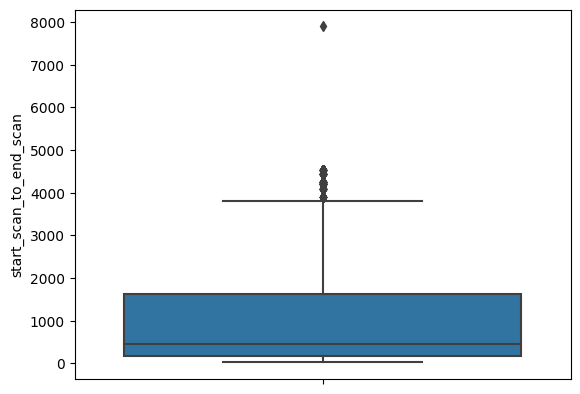

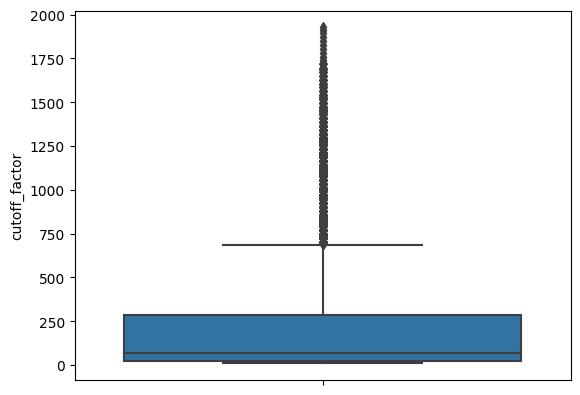

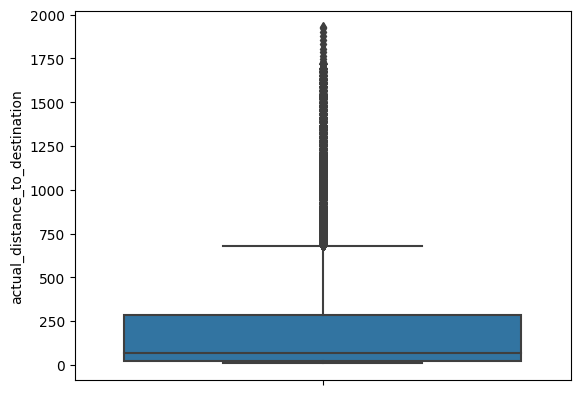

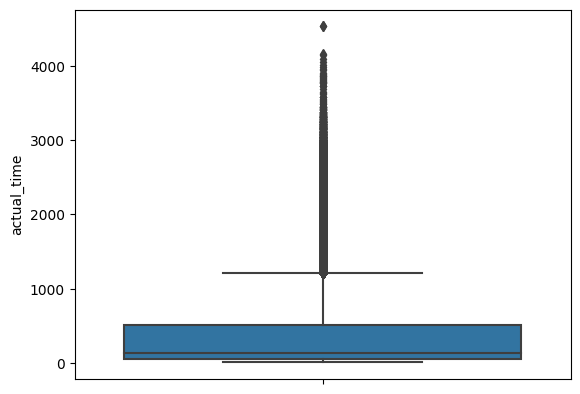

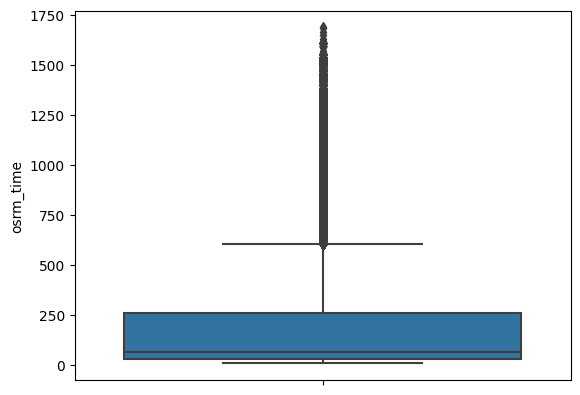

...

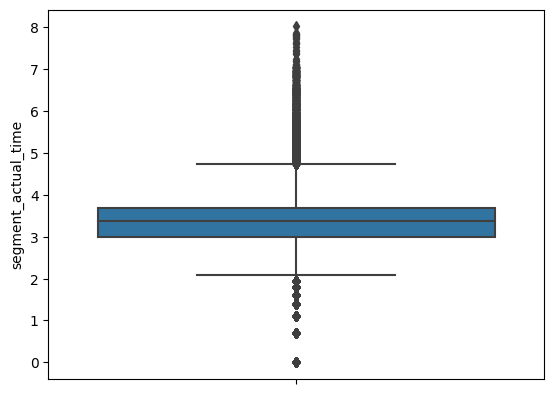

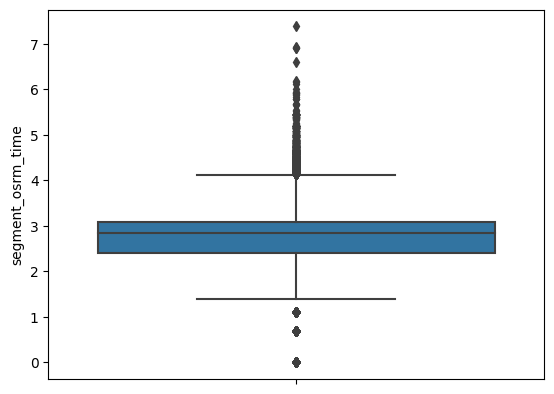

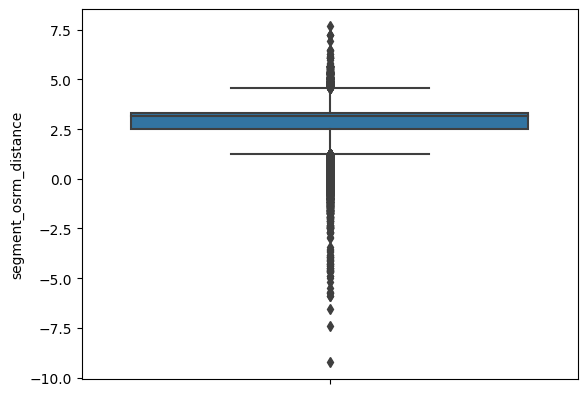

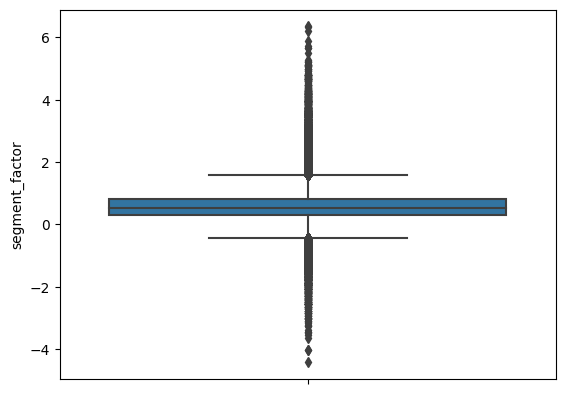

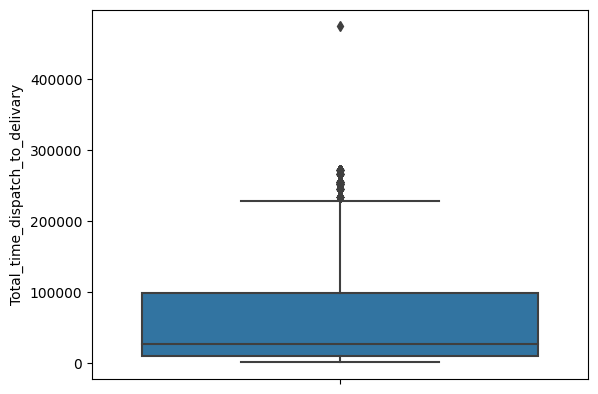

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


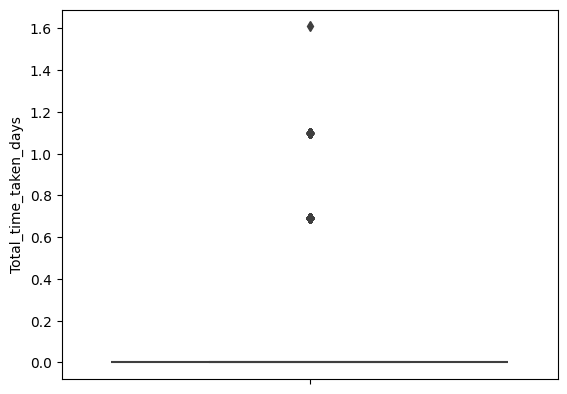

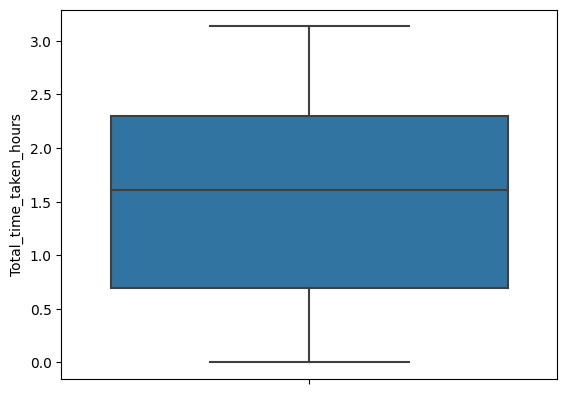

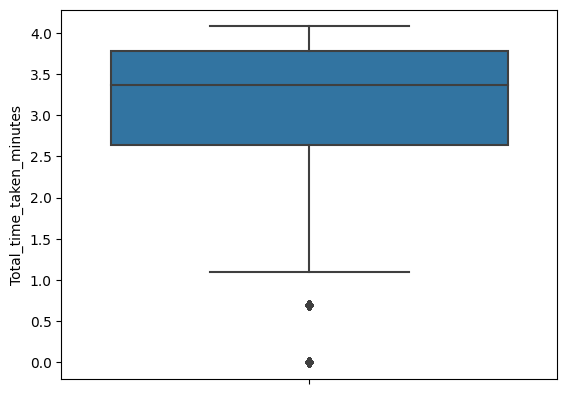

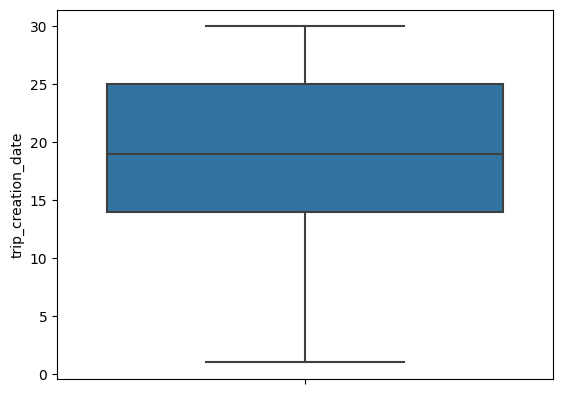

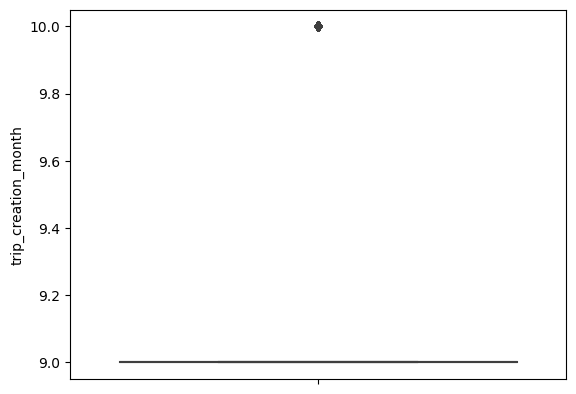

...

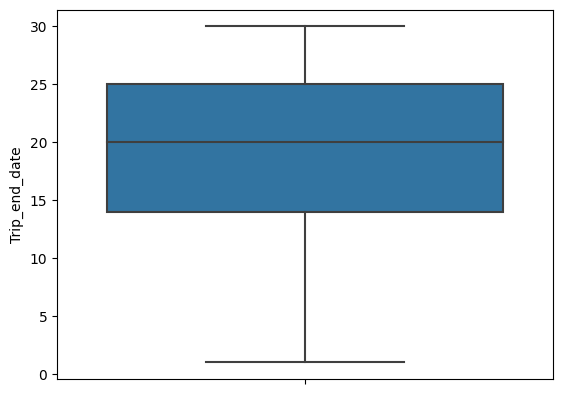

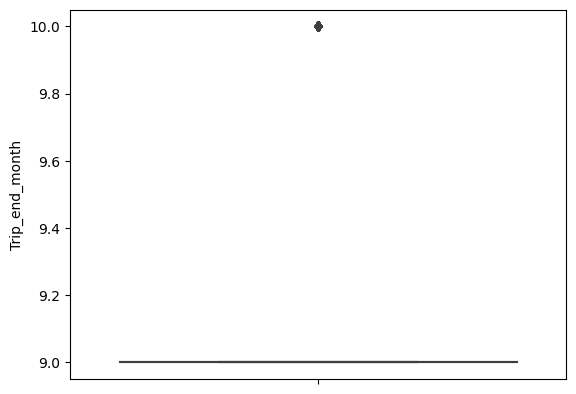

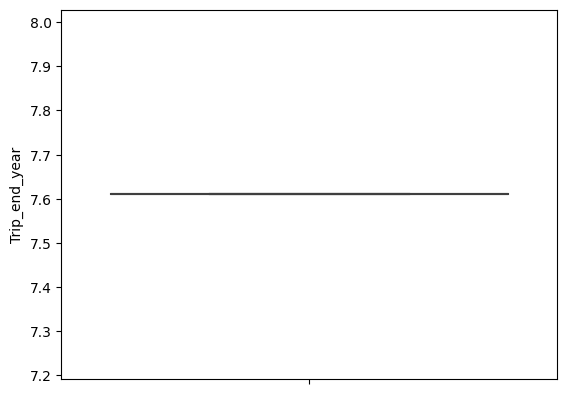

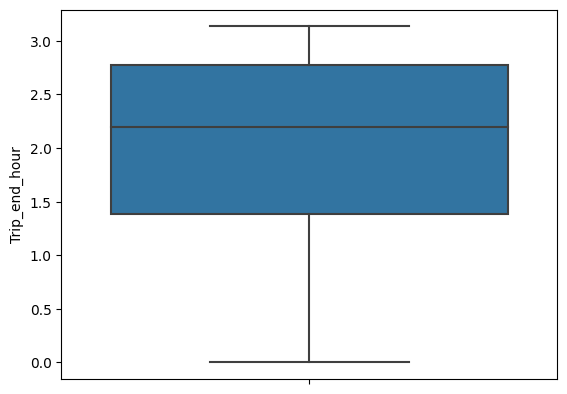

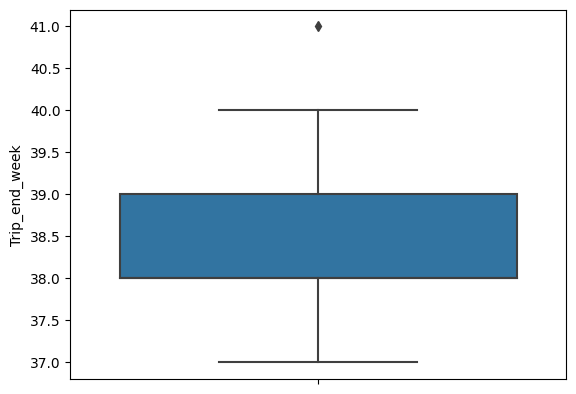

In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
for col in numeric_columns:
    sns.boxplot(y=col, data=df)
    plt.show()

In [ ]:
print('df size previously:', df.shape)
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    whisker_width = 1.5
    outliers = df[(df[col] < Q1 - whisker_width * IQR) | (df[col] > Q3 + whisker_width * IQR)]
    df = df.drop(outliers.index)

print('df size after outlier removal:', df.shape)

df size previously: (144867, 49)


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


df size after outlier removal: (45527, 49)


In [ ]:
correlation_matrix = df.corr()

# Define thresholds for low and high correlation
low_threshold = 0.1
high_threshold = 0.9

# Identify columns with low and high correlation
low_corr_cols = []
high_corr_cols = []

for col in correlation_matrix.columns:
    correlated_cols = correlation_matrix.index[(correlation_matrix[col] > high_threshold) | (correlation_matrix[col] < -high_threshold)]
    if correlated_cols.any():
        high_corr_cols.append(col)
    elif (correlation_matrix[col] > low_threshold).sum() == 1:
        low_corr_cols.append(col)

# Remove columns with low and high correlation
cols_to_drop = low_corr_cols + high_corr_cols
df_filtered = df.drop(columns=cols_to_drop)

# Display the original and filtered DataFrames
print("Original DataFrame:")
print(df.shape)
print('*'*100)
print("\nFiltered DataFrame:")
print(df_filtered.shape)

Original DataFrame:
(45527, 49)
****************************************************************************************************

Filtered DataFrame:
(45527, 25)


<ipython-input-66-cba8343a55b6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


In [ ]:
df.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,Trip_start_date,Trip_start_month,Trip_start_year,Trip_start_hour,Trip_start_week,Trip_end_date,Trip_end_month,Trip_end_year,Trip_end_hour,Trip_end_week
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,7.609862,1.098612,38,20,9,7.609862,1.386294,38
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,7.609862,1.098612,38,20,9,7.609862,1.386294,38
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,7.609862,1.098612,38,20,9,7.609862,1.386294,38
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,7.609862,1.098612,38,20,9,7.609862,1.386294,38
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,20,9,7.609862,1.098612,38,20,9,7.609862,1.386294,38


<ipython-input-68-9ed1be781365>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(method="pearson"),annot=True,cmap="coolwarm")


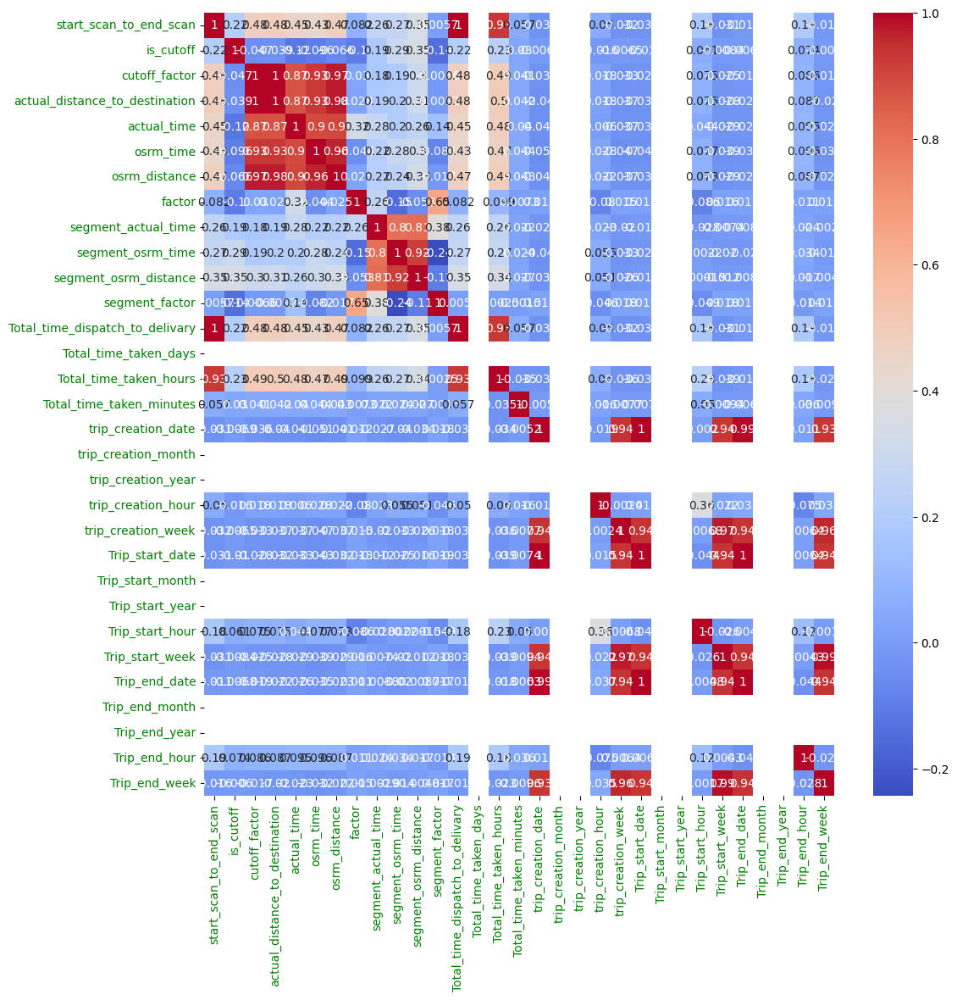

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(method="pearson"),annot=True,cmap="coolwarm")
plt.xticks(rotation=90, color='green')
plt.yticks(rotation=0, color='green')
plt.show()

In [ ]:
# df = df.drop(['destination_center', 'source_center', 'source_name', 'destination_name'], axis=1)
# df.head(1)

# df = df.drop(['trip_creation_time', 'od_start_time', 'od_end_time'], axis=1)
# df.columns

# df = df.drop(['Total_time_dispatch_to_delivary'], axis=1)
# df.head(1)

# df = df.drop(['trip_creation_time', 'od_start_time', 'od_end_time'], axis=1)
# df.head(1)

# df = df.drop(['start_scan_to_end_scan'], axis=1)
# df.head(1)

# df = df.drop(['Total_time_taken_minutes', 'Trip_start_time_year', 'Trip_end_time_year', 'start_scan_to_end_scan_date',
#        'start_scan_to_end_scan_month', 'start_scan_to_end_scan_year','start_scan_to_end_scan_hour', 'start_scan_to_end_scan_week'], axis=1)
# df.head(1)

In [ ]:
Training  = df[df['data'] == 'training']
Test  = df[df['data'] == 'test']
print(df.shape, Training.shape, Test.shape)

(45527, 49) (38413, 49) (7114, 49)


In [ ]:
from scipy.stats import pearsonr, ttest_ind
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

for col1 in numeric_columns:
    for col2 in numeric_columns:
        if col1 != col2:
            # Remove rows with missing values before calculating correlation
            valid_rows = df[[col1, col2]].dropna()

            if not valid_rows.empty:
                corr_coeff, _ = pearsonr(valid_rows[col1], valid_rows[col2])
                p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]

                print(f'Correlation between {col1} and {col2}: {corr_coeff:.3f}')
                print(f'P-value for correlation test: {p_value:.3f}')

                if p_value < 0.05:
                    print('Correlation is statistically significant\n')
                else:
                    print('Correlation is not statistically significant\n')
            else:
                print(f'Not enough valid data for {col1} and {col2}\n')

Correlation between start_scan_to_end_scan and cutoff_factor: 0.479
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and actual_distance_to_destination: 0.482
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and actual_time: 0.448
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and osrm_time: 0.434
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and osrm_distance: 0.471
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and factor: 0.082
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and segment_actual_time: 0.258
P-value for correlation test: 0.000
Correlatio

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between start_scan_to_end_scan and trip_creation_week: -0.032
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_start_date: -0.031
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_start_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_start_hour: 0.175
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_start_week: -0.031
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between start_scan_to_end_scan and Trip_end_date: -0.011
P-value for correlation test: 0.000
Corr

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between cutoff_factor and Trip_end_date: -0.019
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between cutoff_factor and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between cutoff_factor and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between cutoff_factor and Trip_end_hour: 0.086
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between cutoff_factor and Trip_end_week: -0.017
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_distance_to_destination and start_scan_to_end_scan: 0.482
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_distance_to_destination and cutoff_factor: 0.999
P-value for correlation test: 0.000
Correlation is statistically significant


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between actual_time and start_scan_to_end_scan: 0.448
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and cutoff_factor: 0.874
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and actual_distance_to_destination: 0.874
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and osrm_time: 0.897
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and osrm_distance: 0.903
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and factor: 0.324
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and segment_actual_time: 0.281
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time an

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between actual_time and Trip_start_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_start_hour: 0.044
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_start_week: -0.029
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_end_date: -0.026
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between actual_time and Trip_end_hour: 

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between osrm_distance and Trip_start_date: -0.032
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_start_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_start_hour: 0.073
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_start_week: -0.029
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_end_date: -0.023
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distance and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between osrm_distanc

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between factor and Trip_end_date: 0.011
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between factor and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between factor and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between factor and Trip_end_hour: 0.011
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between factor and Trip_end_week: 0.015
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_actual_time and start_scan_to_end_scan: 0.258
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_actual_time and cutoff_factor: 0.178
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_actual_time and actual_distanc

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between segment_actual_time and Trip_end_week: -0.003
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and start_scan_to_end_scan: 0.268
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and cutoff_factor: 0.191
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and actual_distance_to_destination: 0.201
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and actual_time: 0.205
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and osrm_time: 0.282
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_time and osrm_distance: 0.241
P-value for correlation test: 0.000
Correlation is statistically sig

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between segment_osrm_distance and osrm_time: 0.304
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and osrm_distance: 0.332
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and factor: -0.053
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and segment_actual_time: 0.811
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and segment_osrm_time: 0.921
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and segment_factor: -0.106
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_osrm_distance and Total_time_dispatch_to_delivary: 0.345
P-value for correlation test: 0.000
Correla

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between segment_factor and Total_time_dispatch_to_delivary: 0.006
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_factor and Total_time_taken_days: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between segment_factor and Total_time_taken_hours: 0.003
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_factor and Total_time_taken_minutes: -0.002
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_factor and trip_creation_date: 0.018
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_factor and trip_creation_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between segment_factor and trip_creation_year: nan
P-value for correlation test: 0.000
Correlation is st

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa


P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and trip_creation_date: -0.031
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and trip_creation_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and trip_creation_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and trip_creation_hour: 0.050
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and trip_creation_week: -0.032
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_dispatch_to_delivary and Trip_start_date: -0.031
P-value for correlation test: 0.000
Correl

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between Total_time_taken_days and Trip_end_year: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Total_time_taken_days and Trip_end_hour: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Total_time_taken_days and Trip_end_week: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Total_time_taken_hours and start_scan_to_end_scan: 0.929
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_hours and cutoff_factor: 0.492
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_hours and actual_distance_to_destination: 0.495
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_hours and actual_time: 0.482
P-value for correlation test: 0.000

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between Total_time_taken_minutes and cutoff_factor: 0.041
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and actual_distance_to_destination: 0.042
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and actual_time: 0.040
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and osrm_time: 0.044
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and osrm_distance: 0.043
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and factor: 0.007
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Total_time_taken_minutes and segment_actual_time: 0.022
P-value for correlation test: 0.

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between trip_creation_date and factor: 0.012
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and segment_actual_time: -0.027
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and segment_osrm_time: -0.040
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and segment_osrm_distance: -0.034
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and segment_factor: 0.018
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and Total_time_dispatch_to_delivary: -0.031
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_date and Total_time_taken_days: nan
P-value for correlation test: nan
Correlatio

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between trip_creation_month and trip_creation_date: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_month and trip_creation_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_month and trip_creation_hour: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_month and trip_creation_week: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_month and Trip_start_date: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_month and Trip_start_month: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between trip_creation_month and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistical

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between trip_creation_hour and osrm_time: 0.028
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and osrm_distance: 0.022
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and factor: -0.080
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and segment_actual_time: 0.023
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and segment_osrm_time: 0.055
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and segment_osrm_distance: 0.051
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_hour and segment_factor: -0.046
P-value for correlation test: 0.000
Correlation is statistically significa

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between trip_creation_week and osrm_distance: -0.037
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and factor: 0.015
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and segment_actual_time: -0.020
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and segment_osrm_time: -0.033
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and segment_osrm_distance: -0.026
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and segment_factor: 0.018
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between trip_creation_week and Total_time_dispatch_to_delivary: -0.032
P-value for correlation test: 0.000
Correlation i

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa


P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and segment_actual_time: -0.012
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and segment_osrm_time: -0.025
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and segment_osrm_distance: -0.016
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and segment_factor: 0.019
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and Total_time_dispatch_to_delivary: -0.031
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_date and Total_time_taken_days: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Trip_start_date an

<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: 


P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month and segment_osrm_distance: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month and segment_factor: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month and Total_time_dispatch_to_delivary: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month and Total_time_taken_days: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Trip_start_month and Total_time_taken_hours: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month and Total_time_taken_minutes: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_month

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between Trip_start_year and Trip_start_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_year and Trip_start_hour: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_year and Trip_start_week: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_year and Trip_end_date: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_year and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_year and Trip_end_year: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Trip_start_year and Trip_end_hour: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between Trip_start_hour and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_start_week: -0.026
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_end_date: -0.005
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_end_hour: 0.123
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_hour and Trip_end_week: -0.002
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between Trip_start_week and Trip_start_hour: -0.026
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_week and Trip_end_date: 0.937
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_week and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_week and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_week and Trip_end_hour: 0.004
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_start_week and Trip_end_week: 0.986
P-value for correlation test: 0.001
Correlation is statistically significant

Correlation between Trip_end_date and start_scan_to_end_scan: -0.011
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

Correlation between Trip_end_date and Trip_start_date: 0.997
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_start_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_start_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_start_hour: -0.005
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_start_week: 0.937
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_end_month: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date and Trip_end_year: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_date an

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packa

Correlation between Trip_end_year and actual_distance_to_destination: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and actual_time: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and osrm_time: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and osrm_distance: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and factor: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and segment_actual_time: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and segment_osrm_time: nan
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_year and seg

<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the d

Correlation between Trip_end_hour and segment_osrm_distance: 0.017
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_hour and segment_factor: -0.014
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_hour and Total_time_dispatch_to_delivary: 0.188
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_hour and Total_time_taken_days: nan
P-value for correlation test: nan
Correlation is not statistically significant

Correlation between Trip_end_hour and Total_time_taken_hours: 0.184
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_hour and Total_time_taken_minutes: 0.036
P-value for correlation test: 0.000
Correlation is statistically significant

Correlation between Trip_end_hour and trip_creation_date: 0.011
P-value for correlation test: 0.000
Correlation is statist

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
<ipython-input-71-2b9c8fd2cf42>:12: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  p_value = ttest_ind(valid_rows[col1], valid_rows[col2])[1]
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is no

In [ ]:
for col in df.columns:
  print('\n', col,": ", df[col].nunique(), ',', df[col].dtypes)


 data :  2 , object

 trip_creation_time :  9486 , datetime64[ns]

 route_schedule_uuid :  1292 , object

 route_type :  2 , object

 trip_uuid :  9486 , object

 source_center :  1252 , object

 source_name :  1245 , object

 destination_center :  1273 , object

 destination_name :  1264 , object

 od_start_time :  14447 , datetime64[ns]

 od_end_time :  14447 , datetime64[ns]

 start_scan_to_end_scan :  772 , float64

 is_cutoff :  2 , bool

 cutoff_factor :  134 , int64

 cutoff_timestamp :  34044 , object

 actual_distance_to_destination :  45495 , float64

 actual_time :  367 , float64

 osrm_time :  157 , float64

 osrm_distance :  44162 , float64

 factor :  6367 , float64

 segment_actual_time :  141 , float64

 segment_osrm_time :  72 , float64

 segment_osrm_distance :  41572 , float64

 segment_factor :  1764 , float64

 source_pin_code :  1166 , object

 source_place_code :  33 , object

 source_state :  30 , object

 destinaton_pin_code :  1195 , object

 destination_plac

In [ ]:
df.dtypes

data                                       object
trip_creation_time                 datetime64[ns]
route_schedule_uuid                        object
route_type                                 object
trip_uuid                                  object
source_center                              object
source_name                                object
destination_center                         object
destination_name                           object
od_start_time                      datetime64[ns]
od_end_time                        datetime64[ns]
start_scan_to_end_scan                    float64
is_cutoff                                    bool
cutoff_factor                               int64
cutoff_timestamp                           object
actual_distance_to_destination            float64
actual_time                               float64
osrm_time                                 float64
osrm_distance                             float64
factor                                    float64


In [ ]:
categorical_columns = ['route_type', 'is_cutoff']

# Perform one-hot encoding using a loop
for col in categorical_columns:
    encoded_columns = pd.get_dummies(df[col], prefix=col, drop_first=True)
    df = pd.concat([df, encoded_columns], axis=1)
    df.drop(col, axis=1, inplace=True)
df

,data,trip_creation_time,route_schedule_uuid,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,...,Trip_start_year,Trip_start_hour,Trip_start_week,Trip_end_date,Trip_end_month,Trip_end_year,Trip_end_hour,Trip_end_week,route_type_FTL,is_cutoff_True
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,7.609862,1.098612,38,20,9,7.609862,1.386294,38,0,1
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,7.609862,1.098612,38,20,9,7.609862,1.386294,38,0,1
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,7.609862,1.098612,38,20,9,7.609862,1.386294,38,0,1
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,7.609862,1.098612,38,20,9,7.609862,1.386294,38,0,1
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,...,7.609862,1.098612,38,20,9,7.609862,1.386294,38,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144857,training,2018-09-17 11:35:28.838714,thanos::sroute:d8f74492-4484-412a-887a-61c8e6b...,trip-153718412883843340,IND600056AAB,MAA_Poonamallee_HB (Tamil Nadu),IND600032AAB,Chennai_Hub (Tamil Nadu),2018-09-17 11:35:28.838714,2018-09-17 13:32:21.128357,...,7.609862,2.397895,38,17,9,7.609862,2.564949,38,0,0
144858,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,7.609862,2.772589,38,20,9,7.609862,3.135494,38,0,1
144861,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,7.609862,2.772589,38,20,9,7.609862,3.135494,38,0,1
144862,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,...,7.609862,2.772589,38,20,9,7.609862,3.135494,38,0,1
